In [1]:
from lightglue import LightGlue, SuperPoint, viz2d, DISK, SIFT, ALIKED, DoGHardNet
from lightglue.utils import load_image, rbd, match_pair
import matplotlib.pyplot as plt
import cv2 as cv
import numpy as np
import torch
import torchvision.transforms.functional as TF
import os
import cv2
import pandas as pd  # Import pandas
import glob
import math
from tqdm.notebook import tqdm

general_folder_path = '/home/oussama/Documents/EPFL/PDS_LUTS/'

output_path = general_folder_path + 'panorama.jpg'

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

torch.cuda.empty_cache()

# Utility function to calculate image corners in homogeneous coordinates
def get_homogeneous_corners(width, height):
    return np.array([[0, 0, 1], [width, 0, 1], [width, height, 1], [0, height, 1]]).T

def warp_perspective_padded1(src, dst, transf):
    src_h, src_w = src.shape[:2]
    dst_h, dst_w = dst.shape[:2]

    # Define the corners of the src image
    src_corners = np.array([
        [0, 0],
        [src_w, 0],
        [src_w, src_h],
        [0, src_h]
    ], dtype=np.float32)

    # Transform the src corners using the homography matrix (transf)
    src_corners_transformed = cv2.perspectiveTransform(src_corners[None, :, :], transf)[0]

    # Define the corners of the dst image in its own coordinate space
    dst_corners = np.array([
        [0, 0],
        [dst_w, 0],
        [dst_w, dst_h],
        [0, dst_h]
    ], dtype=np.float32)

    # Combine all corners to find the overall bounding box
    all_corners = np.vstack((src_corners_transformed, dst_corners))

    # Compute the bounding box of all corners
    x_min, y_min = np.int32(all_corners.min(axis=0))
    x_max, y_max = np.int32(all_corners.max(axis=0))

    # Calculate the translation needed to shift images to positive coordinates
    shift_x = -x_min
    shift_y = -y_min

    # Compute the size of the output canvas
    output_width = x_max - x_min
    output_height = y_max - y_min

    # Compute the 3x3 translation matrix to shift the images
    translation_matrix = np.array([
        [1, 0, shift_x],
        [0, 1, shift_y],
        [0, 0,      1]
    ], dtype=np.float32)

    # Update the transformation matrix to include the translation
    new_transf = translation_matrix @ transf

    # Warp the src image using the updated transformation matrix
    warped = cv2.warpPerspective(src, new_transf, (output_width, output_height))
    
    # Warp the dst image using only the translation matrix (affine)
    dst_pad = cv2.warpAffine(dst, translation_matrix[:2], (output_width, output_height))

    # Determine the anchor points
    anchorX = int(shift_x)
    anchorY = int(shift_y)

    # Determine the sign
    sign = (anchorX > 0) or (anchorY > 0)

    return dst_pad, warped, anchorX, anchorY, sign

# Rotate image tensor by specified angle
def rotate_image(image, angle):
    return TF.rotate(image, angle)

def rotate_image1(image, angle):
    """
    Rotate a PyTorch image tensor without cropping and add necessary padding to preserve all content.
    Keeps the tensor on its original device (CPU or CUDA).
    Args:
        image: A PyTorch tensor in CHW format with values in [0, 1].
        angle: Rotation angle in degrees (counterclockwise).
    Returns:
        Rotated image as a PyTorch tensor on the same device.
    """
    device = image.device  # Store original device (CPU or CUDA)

    # Convert tensor to NumPy array (HWC format)
    if isinstance(image, torch.Tensor):
        image_np = image.permute(1, 2, 0).cpu().numpy()  # CHW -> HWC on CPU
        if image_np.max() <= 1:  # Scale up to [0, 255] if needed
            image_np = (image_np * 255).astype(np.uint8)
    else:
        raise TypeError("Input must be a PyTorch tensor in CHW format.")

    # Get the height and width of the image
    h, w = image_np.shape[:2]
    center = (w // 2, h // 2)

    # Compute the rotation matrix and new dimensions
    rotation_matrix = cv.getRotationMatrix2D(center, angle, 1.0)
    cos_val = abs(rotation_matrix[0, 0])
    sin_val = abs(rotation_matrix[0, 1])
    new_w = int((h * sin_val) + (w * cos_val))
    new_h = int((h * cos_val) + (w * sin_val))

    # Adjust the rotation matrix to account for translation
    rotation_matrix[0, 2] += (new_w / 2) - center[0]
    rotation_matrix[1, 2] += (new_h / 2) - center[1]

    # Perform rotation with padding
    rotated_image_np = cv.warpAffine(
        image_np, rotation_matrix, (new_w, new_h),
        flags=cv.INTER_CUBIC,
        borderMode=cv.BORDER_CONSTANT,
        borderValue=(0, 0, 0)
    )

    # Convert back to PyTorch tensor (CHW format)
    rotated_image_tensor = torch.from_numpy(rotated_image_np).permute(2, 0, 1).float()
    if rotated_image_tensor.max() > 1:  # Normalize back to [0, 1]
        rotated_image_tensor /= 255.0

    # Move the tensor back to the original device
    return rotated_image_tensor.to(device)

# Calculate similarity score between two images
def compute_similarity_score(image1, image2, extractor, matcher):
    with torch.no_grad():
        feats0 = extractor.extract(image1)
        feats1 = extractor.extract(image2)
        feats0, feats1, matches01 = match_pair(extractor, matcher, image1, image2)
    points0 = feats0['keypoints'][matches01['matches'][..., 0]]
    score = points0.shape[0]
    # Release GPU memory
    del feats0, feats1, matches01, points0
    torch.cuda.empty_cache()
    return score

def split_image_paths(image_paths):
    """
    Splits the image_paths list into two halves:
    - First half gets an extra frame if the total number of images is odd.
    - Second half is reversed to start from the last image and go to the middle.

    Args:
        image_paths (list): List of image paths.

    Returns:
        tuple: (first_half, second_half) - two lists of image paths.
    """
    # Compute the midpoint
    mid = (len(image_paths) + 1) // 2

    # Split the list
    first_half = image_paths[:mid]  # First half
    second_half = image_paths[mid:][::-1]  # Second half, reversed

    return first_half, second_half


In [2]:
# Feature extractor and matcher initialization
extractor = DoGHardNet(max_num_keypoints=None).eval().cuda()
matcher = LightGlue(features='doghardnet').eval().cuda()

start = True
general_folder_path = '/home/oussama/Documents/EPFL/PDS_LUTS/'
image_folder = os.path.join(general_folder_path, 'images_updated')

indice = 0

# Get all .jpg files in the folder
image_paths = glob.glob(os.path.join(image_folder, '*.jpg'))
# Optionally, sort the image paths if order matters
image_paths.sort()

image_paths = image_paths[indice:] + image_paths[:indice]


In [3]:
# Load images
image_path0  = image_paths[0]

# Save first image
cv.imwrite(general_folder_path+'warped_image.jpg', cv.imread(image_path0))

image0 = load_image(image_path0)

# Initialize DataFrame for image corners
image_corners_df = pd.DataFrame(columns=['image_path', 'corners', 'frame_number', 'rotation_angle'])

# Add first image's corners to the DataFrame
first_image_corners = np.array([[0, 0], [image0.shape[2]-1, 0],
                                [image0.shape[2]-1, image0.shape[1]-1],
                                [0, image0.shape[1]-1]], dtype=np.int32)

frame_number = os.path.splitext(os.path.basename(image_path0))[0]

rotation_angle = 0

new_row = pd.DataFrame({
    'image_path': [image_path0],
    'corners': [first_image_corners],
    'frame_number': [frame_number],
    'rotation_angle': [rotation_angle],
})

image_corners_df = pd.concat([image_corners_df, new_row], ignore_index=True)
first_half, second_half = split_image_paths(image_paths)


In [4]:
num = 0
best = 0

for idx in tqdm(range(1, len(first_half))):
    # image_path0 = general_folder_path + 'anchor_test.jpg'
    if not start:
        image_path0  = general_folder_path + 'warped_image.jpg'

    image0 = load_image(image_path0)

    image_path1  = first_half[idx]

    image1 = load_image(image_path1)

    # Determine best rotation angle
    rotation_angles = range(0, 360, 45)
    best_score, best_angle = -1, 0

    for angle in rotation_angles:
        rotated_image1 = rotate_image(image1, angle)
        score = compute_similarity_score(image0, rotated_image1, extractor, matcher)
        if score > best_score:
            best_score, best_angle = score, angle
    best_rotated_image = rotate_image(image1, best_angle)
    # Prepare images for final stitching
    imocv0 = cv.imread(image_path0)
    imocv1 = cv.cvtColor(np.array(TF.to_pil_image(best_rotated_image.cpu()).convert("RGB")), cv.COLOR_RGB2BGR)
    cv.imwrite(general_folder_path + 'rotated_image.jpg', imocv1)

    # Extract keypoints and compute homography matrix
    feats0, feats1, matches01 = match_pair(extractor, matcher, image0, best_rotated_image)
    points0 = feats0['keypoints'][matches01['matches'][..., 0]].cpu().numpy()
    points1 = feats1['keypoints'][matches01['matches'][..., 1]].cpu().numpy()

    if points0.shape[0] >= 4:
        M, _ = cv.findHomography(points1, points0, cv.RANSAC, 5.0)
        
        if num % 1 == 0:
            M_normalized = M / M[2, 2]

            # Extract the rotation and translation components
            M = np.array([
                [M_normalized[0, 0], M_normalized[0, 1], M_normalized[0, 2]],
                [M_normalized[1, 0], M_normalized[1, 1], M_normalized[1, 2]],
                [0,                 0,                 1]
            ])
        num += 1
        # angle_rad = math.atan2(M_normalized[1, 0], M_normalized[0, 0])  # Returns the angle in radians
        angle_rad = math.atan2(M[1, 0], M[0, 0])  # Returns the angle in radians
        angle_deg = math.degrees(angle_rad) - best_angle
        dst_padded, warped_image, anchorX1, anchorY1, sign = warp_perspective_padded1(imocv1, imocv0, M)

        before_last_key = image_corners_df['image_path'].iloc[-1]
        warped_image_corners = image_corners_df.loc[image_corners_df['image_path'] == before_last_key, 'corners'].values[0]
        x_coords, y_coords = warped_image_corners[:, 0], warped_image_corners[:, 1]

        # Define source corners as a numpy array of four points
        corners = np.array([[x_coords[0], y_coords[0]],
                            [x_coords[1], y_coords[1]],
                            [x_coords[2], y_coords[2]],
                            [x_coords[3], y_coords[3]]], dtype=np.float32)

        b_x_min, b_y_min = np.min(corners, axis=0).astype(int)
        b_x_max, b_y_max = np.max(corners, axis=0).astype(int)

        # Define source corners as a numpy array and convert to float32
        new_image_corners = np.array([[0, 0], [imocv1.shape[1], 0],
                                    [imocv1.shape[1], imocv1.shape[0]],
                                    [0, imocv1.shape[0]]], dtype=np.float32)

        # Perform perspective transform with correctly typed data
        transformed_corners = cv.perspectiveTransform(np.array([new_image_corners], dtype=np.float32), M)[0]

        # Update image_corners_df
        # adjusted_corners = transformed_corners + [b_x_min, b_y_min]
        adjusted_corners = transformed_corners + [anchorX1, anchorY1]
        new_row = pd.DataFrame({
            'image_path': [image_path1],
            'corners': [adjusted_corners],
            'frame_number': [os.path.splitext(os.path.basename(image_path1))[0]],
            'rotation_angle': [best_angle],
        })
        image_corners_df = pd.concat([image_corners_df, new_row], ignore_index=True)

        if start:
            idx0 = image_corners_df[image_corners_df['image_path'] == image_path0].index[0]
            image_corners_df.at[idx0, 'corners'] += [anchorX1, anchorY1]
            (anchorX, anchorY) = (0, 0)

        # Overlay warped image onto padded destination
        non_zero_mask = (warped_image > 0).astype(np.uint8)
        dst_padded[non_zero_mask == 1] = warped_image[non_zero_mask == 1]

        # Get last and before last keys
        last_key = image_corners_df['image_path'].iloc[-1]
        warped_image_corners = image_corners_df.loc[image_corners_df['image_path'] == last_key, 'corners'].values[0]
        x_coords, y_coords = warped_image_corners[:, 0], warped_image_corners[:, 1]

        # Define source corners as a numpy array of four points
        corners = np.array([[x_coords[0], y_coords[0]],
                            [x_coords[1], y_coords[1]],
                            [x_coords[2], y_coords[2]],
                            [x_coords[3], y_coords[3]]], dtype=np.float32)

        x_min, y_min = np.min(corners, axis=0).astype(int)
        x_max, y_max = np.max(corners, axis=0).astype(int)

        image_corners_0 = image_corners_df.loc[image_corners_df['image_path'] == before_last_key, 'corners'].values[0]
        image_corners_1 = image_corners_df.loc[image_corners_df['image_path'] == last_key, 'corners'].values[0]

        # Crop the region of interest
        warped_image = warped_image[y_min:y_max, x_min:x_max]
        cv.imwrite(general_folder_path + 'warped_image.jpg', warped_image)

        # # Crop the region of interest
        # image2 = load_image(first_half[idx])
        # image2 = rotate_image(image2, -angle_deg)
        # warped_image = image2
        # cv.imwrite(general_folder_path+'warped_image.jpg', cv.cvtColor(np.array(TF.to_pil_image(image2.cpu()).convert("RGB")), cv.COLOR_RGB2BGR))

        # Save final images
        cv.imwrite(general_folder_path + 'panorama.jpg', dst_padded)
    else:
        print("Not enough points to compute homography.")

    if start:
        cv.imwrite(general_folder_path+'aligned_image.jpg', cv.imread(general_folder_path+'panorama.jpg'))

    # Load the images
    current_panorama = cv.imread(general_folder_path + 'panorama.jpg')
    new_image = cv.imread(general_folder_path + 'aligned_image.jpg')

    # Create a 3x3 translation matrix
    translation_matrix = np.float32([
        [1, 0, b_x_min - anchorX1],
        [0, 1, b_y_min - anchorY1],
        [0, 0, 1]
    ])

    if start:
        # Create a 3x3 translation matrix Identity matrix
        translation_matrix = np.float32([
            [1, 0, 0],
            [0, 1, 0],
            [0, 0, 1]
        ])

    # Apply the translation to the images
    dst_padded, warped_image, anchorX, anchorY, _ = warp_perspective_padded1(current_panorama, new_image, translation_matrix)
    idx = image_corners_df[image_corners_df['image_path'] == last_key].index[0]
    if not start:
        image_corners_df.at[idx, 'corners'] += [b_x_min - anchorX1 + anchorX, b_y_min -anchorY1 + anchorY]
    for img_path in image_corners_df['image_path']:
        if img_path != image_path1:
            idx = image_corners_df[image_corners_df['image_path'] == img_path].index[0]
            image_corners_df.at[idx, 'corners'] += [anchorX, anchorY]
    start = False
    # # Update image_corners for image_path1
    # idx1 = image_corners_df[image_corners_df['image_path'] == image_path1].index[0]
    # image_corners_df.at[idx1, 'corners'] = transformed_corners + [anchorX, anchorY]
    # image_corners_df.at[idx1, 'corners'] = image_corners_df.at[idx1, 'corners'].astype(np.int32)

    # Create a mask where dst_padded has zero pixels
    mask_dst = cv.cvtColor(dst_padded, cv.COLOR_BGR2GRAY)
    mask_dst = (mask_dst == 0).astype(np.uint8)

    # Ensure mask has three channels
    mask_dst_3ch = cv.merge([mask_dst, mask_dst, mask_dst])

    # Combine images by filling zeros in dst_padded with pixels from warped_image
    combined_image = dst_padded.copy()
    combined_image[mask_dst_3ch == 1] = warped_image[mask_dst_3ch == 1]

    # Save the combined image
    cv.imwrite(general_folder_path + 'aligned_image.jpg', combined_image)


  0%|          | 0/16 [00:00<?, ?it/s]

In [5]:
indice = 0

start = True

num = 0

for idx in tqdm(range(indice + 1, len(second_half))):
    # image_path0 = general_folder_path + 'anchor_test.jpg'
    if not start:
        image_path0  = general_folder_path + 'warped_image.jpg'
    else:
        image_path0  = image_paths[0]

    image0 = load_image(image_path0)

    image_path1  = second_half[idx]

    image1 = load_image(image_path1)

    # Determine best rotation angle
    rotation_angles = range(0, 360, 45)
    best_score, best_angle = -1, 0

    for angle in rotation_angles:
        rotated_image1 = rotate_image(image1, angle)
        score = compute_similarity_score(image0, rotated_image1, extractor, matcher)
        if score > best_score:
            best_score, best_angle = score, angle
            best_rotated_image = rotated_image1

    # Prepare images for final stitching
    imocv0 = cv.imread(image_path0)
    imocv1 = cv.cvtColor(np.array(TF.to_pil_image(best_rotated_image.cpu()).convert("RGB")), cv.COLOR_RGB2BGR)

    # Extract keypoints and compute homography matrix
    feats0, feats1, matches01 = match_pair(extractor, matcher, image0, best_rotated_image)
    points0 = feats0['keypoints'][matches01['matches'][..., 0]].cpu().numpy()
    points1 = feats1['keypoints'][matches01['matches'][..., 1]].cpu().numpy()

    if points0.shape[0] >= 4:
        M, _ = cv.findHomography(points1, points0, cv.RANSAC, 5.0)
        
        if num % 1 == 0:
            M_normalized = M / M[2, 2]

            # Extract the rotation and translation components
            M = np.array([
                [M_normalized[0, 0], M_normalized[0, 1], M_normalized[0, 2]],
                [M_normalized[1, 0], M_normalized[1, 1], M_normalized[1, 2]],
                [0,                 0,                 1]
            ])
        num += 1
        # angle_rad = math.atan2(M_normalized[1, 0], M_normalized[0, 0])  # Returns the angle in radians
        angle_rad = math.atan2(M[1, 0], M[0, 0])  # Returns the angle in radians
        angle_deg = math.degrees(angle_rad) + best_angle

        dst_padded, warped_image, anchorX1, anchorY1, sign = warp_perspective_padded1(imocv1, imocv0, M)

        if start:
            before_last_key = image_corners_df['image_path'].iloc[0]
            warped_image_corners = image_corners_df.loc[image_corners_df['image_path'] == before_last_key, 'corners'].values[0]
            x_coords, y_coords = warped_image_corners[:, 0], warped_image_corners[:, 1]
        else : 
            before_last_key = image_corners_df['image_path'].iloc[-1]
            warped_image_corners = image_corners_df.loc[image_corners_df['image_path'] == before_last_key, 'corners'].values[0]
            x_coords, y_coords = warped_image_corners[:, 0], warped_image_corners[:, 1]

        # Define source corners as a numpy array of four points
        corners = np.array([[x_coords[0], y_coords[0]],
                            [x_coords[1], y_coords[1]],
                            [x_coords[2], y_coords[2]],
                            [x_coords[3], y_coords[3]]], dtype=np.float32)

        b_x_min, b_y_min = np.min(corners, axis=0).astype(int)
        b_x_max, b_y_max = np.max(corners, axis=0).astype(int)

        # Define source corners as a numpy array and convert to float32
        new_image_corners = np.array([[0, 0], [imocv1.shape[1], 0],
                                    [imocv1.shape[1], imocv1.shape[0]],
                                    [0, imocv1.shape[0]]], dtype=np.float32)

        # Perform perspective transform with correctly typed data
        transformed_corners = cv.perspectiveTransform(np.array([new_image_corners], dtype=np.float32), M)[0]

        # Update image_corners_df
        # adjusted_corners = transformed_corners + [b_x_min, b_y_min]
        adjusted_corners = transformed_corners + [anchorX1, anchorY1]
        new_row = pd.DataFrame({
            'image_path': [image_path1],
            'corners': [adjusted_corners],
            'frame_number': [os.path.splitext(os.path.basename(image_path1))[0]],
            'rotation_angle': [best_angle],
        })
        image_corners_df = pd.concat([image_corners_df, new_row], ignore_index=True)
        
        # Overlay warped image onto padded destination
        non_zero_mask = (warped_image > 0).astype(np.uint8)
        dst_padded[non_zero_mask == 1] = warped_image[non_zero_mask == 1]

        # Get last and before last keys
        last_key = image_corners_df['image_path'].iloc[-1]
        warped_image_corners = image_corners_df.loc[image_corners_df['image_path'] == last_key, 'corners'].values[0]
        x_coords, y_coords = warped_image_corners[:, 0], warped_image_corners[:, 1]

        # Define source corners as a numpy array of four points
        corners = np.array([[x_coords[0], y_coords[0]],
                            [x_coords[1], y_coords[1]],
                            [x_coords[2], y_coords[2]],
                            [x_coords[3], y_coords[3]]], dtype=np.float32)

        x_min, y_min = np.min(corners, axis=0).astype(int)
        x_max, y_max = np.max(corners, axis=0).astype(int)

        image_corners_0 = image_corners_df.loc[image_corners_df['image_path'] == before_last_key, 'corners'].values[0]
        image_corners_1 = image_corners_df.loc[image_corners_df['image_path'] == last_key, 'corners'].values[0]

        # Crop the region of interest
        warped_image = warped_image[y_min:y_max, x_min:x_max]
        cv.imwrite(general_folder_path + 'warped_image.jpg', warped_image)

        # image2 = load_image(second_half[idx])
        # image2 = rotate_image1(image2, -angle_deg)
        # warped_image = image2
        # cv.imwrite(general_folder_path+'warped_image.jpg', cv.cvtColor(np.array(TF.to_pil_image(image2.cpu()).convert("RGB")), cv.COLOR_RGB2BGR))

        # Save final images
        cv.imwrite(general_folder_path + 'panorama.jpg', dst_padded)
    else:
        print("Not enough points to compute homography.")

    # Load the images
    current_panorama = cv.imread(general_folder_path + 'panorama.jpg')
    new_image = cv.imread(general_folder_path + 'aligned_image.jpg')

    # Create a 3x3 translation matrix
    translation_matrix = np.float32([
        [1, 0, b_x_min - anchorX1],
        [0, 1, b_y_min - anchorY1],
        [0, 0, 1]
    ])

    # Apply the translation to the images
    dst_padded, warped_image, anchorX, anchorY, _ = warp_perspective_padded1(current_panorama, new_image, translation_matrix)
    idx = image_corners_df[image_corners_df['image_path'] == last_key].index[0]
    image_corners_df.at[idx, 'corners'] += [b_x_min - anchorX1 + anchorX, b_y_min -anchorY1 + anchorY]
    for img_path in image_corners_df['image_path']:
        if img_path != image_path1:
            idx = image_corners_df[image_corners_df['image_path'] == img_path].index[0]
            image_corners_df.at[idx, 'corners'] += [anchorX, anchorY]

    start = False

    # Create a mask where dst_padded has zero pixels
    mask_dst = cv.cvtColor(dst_padded, cv.COLOR_BGR2GRAY)
    mask_dst = (mask_dst == 0).astype(np.uint8)

    # Ensure mask has three channels
    mask_dst_3ch = cv.merge([mask_dst, mask_dst, mask_dst])

    # Combine images by filling zeros in dst_padded with pixels from warped_image
    combined_image = dst_padded.copy()
    combined_image[mask_dst_3ch == 1] = warped_image[mask_dst_3ch == 1]

    # Save the combined image
    cv.imwrite(general_folder_path + 'aligned_image.jpg', combined_image)

cv.imwrite(general_folder_path + 'final_panorama.jpg', combined_image)


  0%|          | 0/15 [00:00<?, ?it/s]

True

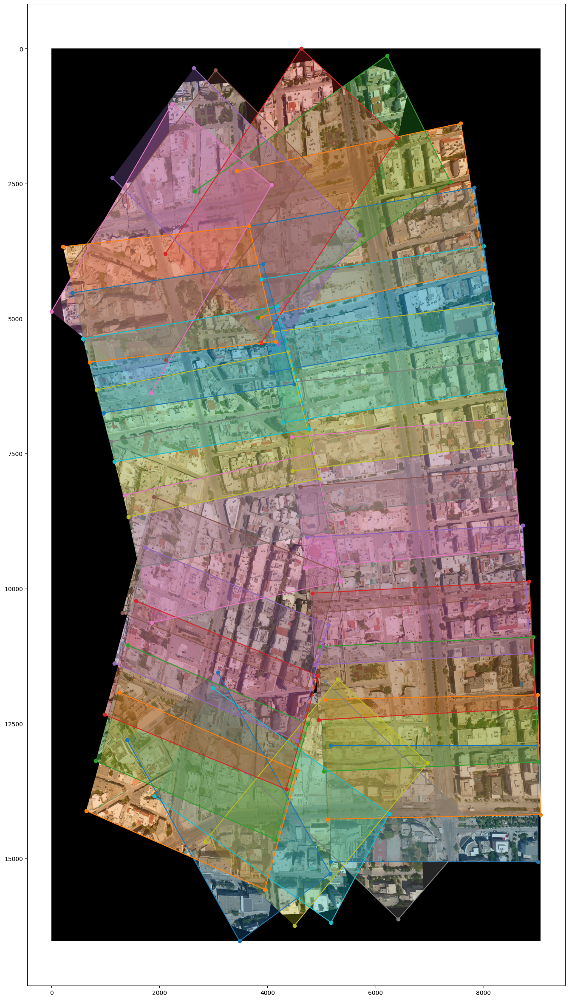

In [6]:
plt.figure(figsize=(40, 30))
# Update and display the panorama with corner points
plt.imshow(cv.cvtColor(combined_image, cv.COLOR_BGR2RGB))
for _, row in image_corners_df.iterrows():
    corners = row['corners']
    x_coords, y_coords = corners[:, 0], corners[:, 1]
    plt.plot(x_coords, y_coords, 'o-', label=os.path.basename(row['image_path']))
    plt.fill(x_coords, y_coords, alpha=0.3)
plt.axis('on')
# plt.legend()  # Uncomment if you want to add a legend
plt.show()

# Save the df to a csv file
image_corners_df.to_csv(general_folder_path + 'results/image_corners.csv', index=False)

torch.cuda.empty_cache()



In [1]:
#############################################
# Imports and Configuration
#############################################

import os
import glob
import cv2
import cv2 as cv
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torchvision.transforms.functional as TF
from tqdm.notebook import tqdm
import math
from PIL import Image

from lightglue import LightGlue, DoGHardNet
from lightglue.utils import load_image, match_pair

# Set paths and constants
GENERAL_FOLDER_PATH = '/home/oussama/Documents/EPFL/PDS_LUTS/'
IMAGE_FOLDER = os.path.join(GENERAL_FOLDER_PATH, 'images_updated')
PANORAMA_OUTPUT_PATH = os.path.join(GENERAL_FOLDER_PATH, 'panorama.jpg')
RESULTS_FOLDER = os.path.join(GENERAL_FOLDER_PATH, 'results')
if not os.path.exists(RESULTS_FOLDER):
    os.makedirs(RESULTS_FOLDER)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
torch.cuda.empty_cache()

# Utility functions
def rotate_image(image, angle):
    """Rotate a PIL image tensor by a given angle."""
    return TF.rotate(image, angle)

def rotate_image1(image, angle):
    """
    Rotate an image without cropping and add necessary padding to preserve all content.

    Args:
        image: A PIL Image or PyTorch tensor.
        angle: Rotation angle in degrees (counterclockwise).

    Returns:
        Rotated image with padding to fit all content.
    """
    # Convert to PIL Image if it's a tensor
    if isinstance(image, torch.Tensor):
        image = TF.to_pil_image(image)

    # Get original dimensions
    w, h = image.size

    # Calculate new canvas size to fit the rotated image
    angle_rad = math.radians(angle)
    new_w = int(abs(w * math.cos(angle_rad)) + abs(h * math.sin(angle_rad)))
    new_h = int(abs(w * math.sin(angle_rad)) + abs(h * math.cos(angle_rad)))

    # Create a larger blank canvas with padding
    canvas = Image.new("RGBA", (new_w, new_h), (0, 0, 0, 0))

    # Calculate the translation to center the original image
    translation_x = (new_w - w) // 2
    translation_y = (new_h - h) // 2

    # Paste the original image into the center of the blank canvas
    canvas.paste(image, (translation_x, translation_y))

    # Rotate the entire canvas
    rotated = canvas.rotate(angle, resample=Image.BICUBIC, expand=False)

    # Convert back to RGB if the original image was RGB
    if image.mode == "RGB":
        rotated = rotated.convert("RGB")

    return rotated

def compute_similarity_score(image1, image2, extractor, matcher):
    """Compute similarity score between two images based on matched keypoints."""
    with torch.no_grad():
        feats0, feats1, matches01 = match_pair(extractor, matcher, image1, image2)
    points0 = feats0['keypoints'][matches01['matches'][..., 0]]
    score = points0.shape[0]
    del feats0, feats1, matches01, points0
    torch.cuda.empty_cache()
    return score

def split_image_paths(image_paths):
    """
    Splits the image_paths list into two halves:
    - First half gets an extra frame if the total number of images is odd.
    - Second half is reversed to start from the last image and go to the middle.

    Args:
        image_paths (list): List of image paths.

    Returns:
        tuple: (first_half, second_half) - two lists of image paths.
    """
    # Compute the midpoint
    mid = (len(image_paths) + 1) // 2

    # Split the list
    first_half = image_paths[:mid]  # First half
    second_half = image_paths[mid:][::-1]  # Second half, reversed

    return first_half, second_half

def warp_perspective_padded(src, dst, transf):
    """Warp 'src' image into 'dst' image using a homography 'transf' with padding."""
    src_h, src_w = src.shape[:2]
    dst_h, dst_w = dst.shape[:2]

    src_corners = np.float32([[0, 0],
                              [src_w, 0],
                              [src_w, src_h],
                              [0, src_h]])
    dst_corners = np.float32([[0, 0],
                              [dst_w, 0],
                              [dst_w, dst_h],
                              [0, dst_h]])

    src_corners_transformed = cv2.perspectiveTransform(src_corners[None, :, :], transf)[0]
    all_corners = np.vstack((src_corners_transformed, dst_corners))

    x_min, y_min = np.int32(all_corners.min(axis=0))
    x_max, y_max = np.int32(all_corners.max(axis=0))

    shift_x = -x_min
    shift_y = -y_min
    output_width = x_max - x_min
    output_height = y_max - y_min

    translation_matrix = np.array([
        [1, 0, shift_x],
        [0, 1, shift_y],
        [0, 0, 1]
    ], dtype=np.float32)

    new_transf = translation_matrix @ transf
    warped = cv2.warpPerspective(src, new_transf, (output_width, output_height))
    dst_pad = cv2.warpAffine(dst, translation_matrix[:2], (output_width, output_height))

    anchorX = int(shift_x)
    anchorY = int(shift_y)
    sign = (anchorX > 0) or (anchorY > 0)
    return dst_pad, warped, anchorX, anchorY, sign

#############################################
# Initialization
#############################################

# Feature extractor and matcher
extractor = DoGHardNet(max_num_keypoints=None).eval().cuda()
matcher = LightGlue(features='doghardnet').eval().cuda()

start = True



In [2]:
# import math
# import numpy as np
# from PIL import Image
# import torchvision.transforms.functional as TF
# import cv2 as cv
# import matplotlib.pyplot as plt

# def rotate_image_with_padding(image, angle):
#     """
#     Rotate an image without cropping and add necessary padding to preserve all content.

#     Args:
#         image: A PIL Image or PyTorch tensor.
#         angle: Rotation angle in degrees (counterclockwise).

#     Returns:
#         Rotated image with padding to fit all content.
#     """
#     # Convert to PIL Image if it's a tensor
#     if isinstance(image, torch.Tensor):
#         image = TF.to_pil_image(image)

#     # Get original dimensions
#     w, h = image.size

#     # Calculate new canvas size to fit the rotated image
#     angle_rad = math.radians(angle)
#     new_w = int(abs(w * math.cos(angle_rad)) + abs(h * math.sin(angle_rad)))
#     new_h = int(abs(w * math.sin(angle_rad)) + abs(h * math.cos(angle_rad)))

#     # Create a larger blank canvas with padding
#     canvas = Image.new("RGBA", (new_w, new_h), (0, 0, 0, 0))

#     # Calculate the translation to center the original image
#     translation_x = (new_w - w) // 2
#     translation_y = (new_h - h) // 2

#     # Paste the original image into the center of the blank canvas
#     canvas.paste(image, (translation_x, translation_y))

#     # Rotate the entire canvas
#     rotated = canvas.rotate(angle, resample=Image.BICUBIC, expand=False)

#     # Convert back to RGB if the original image was RGB
#     if image.mode == "RGB":
#         rotated = rotated.convert("RGB")

#     return rotated
# image10 = load_image(image_paths[-1])
# image10 = rotate_image_with_padding(image10, 10)
# image10 = cv.cvtColor(np.array(image10), cv.COLOR_RGB2BGR)
# plt.imshow(cv.cvtColor(image10, cv.COLOR_BGR2RGB))


In [3]:
#############################################
# Get all images to stitch
#############################################

# Load all images
image_paths = glob.glob(os.path.join(IMAGE_FOLDER, '*.jpg'))
image_paths.sort()  # Ensure consistent order

# Select the first image as a reference
indice = 12
image_paths = image_paths[indice:] + image_paths[:indice]
image_path0 = image_paths[0]

# Save and load the first image in both cv and tensor form
cv.imwrite(os.path.join(GENERAL_FOLDER_PATH, 'warped_image.jpg'), cv.imread(image_path0))
image0 = load_image(image_path0)
imocv0 = cv.imread(image_path0)

# Prepare DataFrame to store image corners and frame numbers
image_corners_df = pd.DataFrame(columns=['image_path', 'corners', 'frame_number'])

# Compute corners of the first image
first_image_corners = np.array([
    [0, 0],
    [imocv0.shape[1]-1, 0],
    [imocv0.shape[1]-1, imocv0.shape[0]-1],
    [0, imocv0.shape[0]-1]
], dtype=np.int32)

frame_number = os.path.splitext(os.path.basename(image_path0))[0]

# Add the first image's corners directly
new_row = pd.DataFrame({
    'image_path': [image_path0],
    'corners': [first_image_corners],
    'frame_number': [frame_number]
})
image_corners_df = pd.concat([image_corners_df, new_row], ignore_index=True)# Define the maximum number of images to process (for demonstration)
# For a real scenario, you can use: for idx in range(indice+1, len(image_paths)):
for idx in tqdm(range(0 + 1, 8)):
    if not start:
        # After the first iteration, image0 is the "warped_image.jpg"
        image_path0 = os.path.join(GENERAL_FOLDER_PATH, 'warped_image.jpg')

    image0 = load_image(image_path0)
    image_path1 = image_paths[idx]
    image1 = load_image(image_path1)

    # Determine best rotation angle
    rotation_angles = range(0, 360, 45)
    best_score, best_angle = -1, 0
    best_rotated_image = None

    for angle in rotation_angles:
        rotated_image1 = rotate_image(image1, angle)
        score = compute_similarity_score(image0, rotated_image1, extractor, matcher)
        if score > best_score:
            best_score = score
            best_angle = angle
            best_rotated_image = rotated_image1

    imocv0 = cv.imread(image_path0)
    imocv1 = cv.cvtColor(np.array(TF.to_pil_image(best_rotated_image.cpu()).convert("RGB")), cv.COLOR_RGB2BGR)

    feats0, feats1, matches01 = match_pair(extractor, matcher, image0, best_rotated_image)
    points0 = feats0['keypoints'][matches01['matches'][..., 0]].cpu().numpy()
    points1 = feats1['keypoints'][matches01['matches'][..., 1]].cpu().numpy()

    if points0.shape[0] < 4:
        print("Not enough points to compute homography for image:", image_path1)
        continue

    M, _ = cv.findHomography(points1, points0, cv.RANSAC, 5.0)
    M_normalized = M / M[2, 2]
    M = np.array([
        [M_normalized[0, 0], M_normalized[0, 1], M_normalized[0, 2]],
        [M_normalized[1, 0], M_normalized[1, 1], M_normalized[1, 2]],
        [0,                  0,                  1]
    ])

    angle_rad = math.atan2(M_normalized[1, 0], M_normalized[0, 0])  # Returns the angle in radians
    angle_deg = math.degrees(angle_rad) + best_angle
    print(f"Rotation angle: {angle_deg:.2f} degrees")

    dst_padded, warped_image, anchorX1, anchorY1, sign = warp_perspective_padded(imocv1, imocv0, M)

    # If not the very first iteration, retrieve corners from the previous image
    if not start:
        before_last_key = image_corners_df['image_path'].iloc[-1]
        warped_image_corners = image_corners_df.loc[
            image_corners_df['image_path'] == before_last_key, 'corners'
        ].values[0]
    else:
        # If it's the start, just use the first image's corners
        warped_image_corners = image_corners_df.loc[
            image_corners_df['image_path'] == image_path0, 'corners'
        ].values[0]

    x_coords, y_coords = warped_image_corners[:, 0], warped_image_corners[:, 1]
    prev_corners = np.array([
        [x_coords[0], y_coords[0]],
        [x_coords[1], y_coords[1]],
        [x_coords[2], y_coords[2]],
        [x_coords[3], y_coords[3]]
    ], dtype=np.float32)

    b_x_min, b_y_min = np.min(prev_corners, axis=0).astype(int)
    b_x_max, b_y_max = np.max(prev_corners, axis=0).astype(int)

    new_image_corners = np.array([
        [0, 0],
        [imocv1.shape[1], 0],
        [imocv1.shape[1], imocv1.shape[0]],
        [0, imocv1.shape[0]]
    ], dtype=np.float32)

    transformed_corners = cv2.perspectiveTransform(np.array([new_image_corners], dtype=np.float32), M)[0]
    adjusted_corners = transformed_corners + [anchorX1, anchorY1]

    # Add new image corners
    new_row = pd.DataFrame({
        'image_path': [image_path1],
        'corners': [adjusted_corners],
        'frame_number': [os.path.splitext(os.path.basename(image_path1))[0]]
    })
    image_corners_df = pd.concat([image_corners_df, new_row], ignore_index=True)

    if start:
        # Adjust the first image's corners once we have anchorX1, anchorY1
        idx0 = image_corners_df[image_corners_df['image_path'] == image_path0].index[0]
        image_corners_df.at[idx0, 'corners'] += [anchorX1, anchorY1]
        (anchorX, anchorY) = (0, 0)

    # Overlay warped image onto padded destination
    non_zero_mask = (warped_image > 0).astype(np.uint8)
    dst_padded[non_zero_mask == 1] = warped_image[non_zero_mask == 1]

    # Get last image's corners to crop the region of interest
    last_key = image_corners_df['image_path'].iloc[-1]
    warped_image_corners = image_corners_df.loc[image_corners_df['image_path'] == last_key, 'corners'].values[0]
    x_coords, y_coords = warped_image_corners[:, 0], warped_image_corners[:, 1]
    current_corners = np.array([
        [x_coords[0], y_coords[0]],
        [x_coords[1], y_coords[1]],
        [x_coords[2], y_coords[2]],
        [x_coords[3], y_coords[3]]
    ], dtype=np.float32)

    x_min, y_min = np.min(current_corners, axis=0).astype(int)
    x_max, y_max = np.max(current_corners, axis=0).astype(int)

    warped_image = warped_image[y_min:y_max, x_min:x_max]
    cv.imwrite(os.path.join(GENERAL_FOLDER_PATH, 'warped_image.jpg'), warped_image)
    # image2 = load_image(image_paths[idx])
    # image2 = rotate_image1(image2, -angle_deg)
    # cv.imwrite(GENERAL_FOLDER_PATH, 'warped_image.jpg', cv.cvtColor(np.array(image2), cv.COLOR_RGB2BGR))
    # cv.imwrite(PANORAMA_OUTPUT_PATH, dst_padded)

    if start:
        cv.imwrite(os.path.join(GENERAL_FOLDER_PATH, 'aligned_image.jpg'), cv.imread(PANORAMA_OUTPUT_PATH))

    # Load current panorama and aligned image
    current_panorama = cv.imread(PANORAMA_OUTPUT_PATH)
    new_image = cv.imread(os.path.join(GENERAL_FOLDER_PATH, 'aligned_image.jpg'))

    # Create translation matrix
    translation_matrix = np.float32([
        [1, 0, b_x_min - anchorX1],
        [0, 1, b_y_min - anchorY1],
        [0, 0, 1]
    ])

    if start:
        # For the first step, no translation needed
        translation_matrix = np.float32([
            [1, 0, 0],
            [0, 1, 0],
            [0, 0, 1]
        ])

    dst_padded, warped_image, anchorX, anchorY, _ = warp_perspective_padded(current_panorama, new_image, translation_matrix)

    # Update DataFrame for all previous images (except the newly added one)
    idx_last = image_corners_df[image_corners_df['image_path'] == last_key].index[0]
    if not start:
        image_corners_df.at[idx_last, 'corners'] += [b_x_min - anchorX1 + anchorX, b_y_min - anchorY1 + anchorY]

    for img_path in image_corners_df['image_path']:
        if img_path != image_path1:
            idx_img = image_corners_df[image_corners_df['image_path'] == img_path].index[0]
            image_corners_df.at[idx_img, 'corners'] += [anchorX, anchorY]

    start = False

    # Combine images by filling zero pixels in dst_padded with warped_image pixels
    mask_dst = cv.cvtColor(dst_padded, cv.COLOR_BGR2GRAY)
    mask_dst = (mask_dst == 0).astype(np.uint8)
    mask_dst_3ch = cv.merge([mask_dst, mask_dst, mask_dst])
    combined_image = dst_padded.copy()
    combined_image[mask_dst_3ch == 1] = warped_image[mask_dst_3ch == 1]

    # Save the combined image as the newly aligned image
    cv.imwrite(os.path.join(GENERAL_FOLDER_PATH, 'aligned_image.jpg'), combined_image)

# Final panorama
cv.imwrite(os.path.join(GENERAL_FOLDER_PATH, 'final_panorama.jpg'), combined_image)


  0%|          | 0/7 [00:00<?, ?it/s]

Rotation angle: -21.85 degrees
Rotation angle: -21.72 degrees
Rotation angle: -22.01 degrees
Rotation angle: -26.05 degrees
Rotation angle: 144.72 degrees
Rotation angle: 142.11 degrees
Rotation angle: 234.07 degrees


True

## Updated two way stitching

In [1]:
# %% [markdown]
# # Refactored Panorama Stitching Code

# %% [code]
import os
import glob
import math
import cv2 as cv
import cv2
import torch
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
import torchvision.transforms.functional as TF

from lightglue import LightGlue, SuperPoint, viz2d, DISK, SIFT, ALIKED, DoGHardNet
from lightglue.utils import load_image, rbd, match_pair

# %% [code]
#######################################
# Global Configuration & Setup
#######################################
general_folder_path = '/home/oussama/Documents/EPFL/PDS_LUTS/'
output_path = os.path.join(general_folder_path, 'panorama.jpg')
image_folder = os.path.join(general_folder_path, 'images_updated')

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
torch.cuda.empty_cache()

# Utility functions
def rotate_image(image, angle):
    """Rotate a PIL image tensor by a given angle."""
    return TF.rotate(image, angle)

def rotate_image_preserve(image: torch.Tensor, angle: float) -> torch.Tensor:
    """
    Rotate a PyTorch image tensor by a specified angle without cropping,
    adding necessary padding to preserve all content.
    """
    device = image.device
    image_np = image.permute(1, 2, 0).cpu().numpy()
    if image_np.max() <= 1:
        image_np = (image_np * 255).astype(np.uint8)

    h, w = image_np.shape[:2]
    center = (w // 2, h // 2)
    rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
    cos_val = abs(rotation_matrix[0, 0])
    sin_val = abs(rotation_matrix[0, 1])

    new_w = int(h * sin_val + w * cos_val)
    new_h = int(h * cos_val + w * sin_val)

    rotation_matrix[0, 2] += (new_w / 2) - center[0]
    rotation_matrix[1, 2] += (new_h / 2) - center[1]

    rotated_image_np = cv2.warpAffine(
        image_np, rotation_matrix, (new_w, new_h),
        flags=cv2.INTER_CUBIC,
        borderMode=cv2.BORDER_CONSTANT,
        borderValue=(0, 0, 0)
    )

    rotated_image_tensor = torch.from_numpy(rotated_image_np).permute(2, 0, 1).float()
    if rotated_image_tensor.max() > 1:
        rotated_image_tensor /= 255.0

    return rotated_image_tensor.to(device)

def compute_similarity_score(image1, image2, extractor, matcher):
    """Compute similarity score between two images based on matched keypoints."""
    with torch.no_grad():
        feats0, feats1, matches01 = match_pair(extractor, matcher, image1, image2)
    points0 = feats0['keypoints'][matches01['matches'][..., 0]]
    score = points0.shape[0]
    del feats0, feats1, matches01, points0
    torch.cuda.empty_cache()
    return score

def split_image_paths(image_paths):
    """
    Splits the image_paths list into two halves:
    - First half gets an extra frame if the total number of images is odd.
    - Second half is reversed to start from the last image and go to the middle.

    Args:
        image_paths (list): List of image paths.

    Returns:
        tuple: (first_half, second_half) - two lists of image paths.
    """
    # Compute the midpoint
    mid = (len(image_paths) + 1) // 2

    # Split the list
    first_half = image_paths[:mid]  # First half
    second_half = image_paths[mid:][::-1]  # Second half, reversed

    return first_half, second_half

def warp_perspective_padded(src, dst, transf):
    """Warp 'src' image into 'dst' image using a homography 'transf' with padding."""
    src_h, src_w = src.shape[:2]
    dst_h, dst_w = dst.shape[:2]

    src_corners = np.float32([[0, 0],
                              [src_w, 0],
                              [src_w, src_h],
                              [0, src_h]])
    dst_corners = np.float32([[0, 0],
                              [dst_w, 0],
                              [dst_w, dst_h],
                              [0, dst_h]])

    src_corners_transformed = cv2.perspectiveTransform(src_corners[None, :, :], transf)[0]
    all_corners = np.vstack((src_corners_transformed, dst_corners))

    x_min, y_min = np.int32(all_corners.min(axis=0))
    x_max, y_max = np.int32(all_corners.max(axis=0))

    shift_x = -x_min
    shift_y = -y_min
    output_width = x_max - x_min
    output_height = y_max - y_min

    translation_matrix = np.array([
        [1, 0, shift_x],
        [0, 1, shift_y],
        [0, 0, 1]
    ], dtype=np.float32)

    new_transf = translation_matrix @ transf
    warped = cv2.warpPerspective(src, new_transf, (output_width, output_height))
    dst_pad = cv2.warpAffine(dst, translation_matrix[:2], (output_width, output_height))

    anchorX = int(shift_x)
    anchorY = int(shift_y)
    return dst_pad, warped, anchorX, anchorY

def split_image_paths(image_paths: list) -> (list, list):
    """
    Splits the image_paths list into two halves:
    - First half gets an extra frame if the total number of images is odd.
    - Second half is reversed (so that it starts from the last image and goes towards the middle).
    """
    mid = (len(image_paths) + 1) // 2
    first_half = image_paths[:mid]
    second_half = image_paths[mid:][::-1]
    return first_half, second_half

def choose_best_rotation(image0: torch.Tensor, image1: torch.Tensor, extractor, matcher, angles=range(0,360,45)):
    """Find the best rotation angle for image1 to match image0."""
    best_score, best_angle = -1, 0
    for angle in angles:
        rotated = rotate_image(image1, angle)
        score = compute_similarity_score(image0, rotated, extractor, matcher)
        if score > best_score:
            best_score, best_angle = score, angle
    return best_angle

def update_corners_df(image_corners_df: pd.DataFrame, image_path: str, corners: np.ndarray, rotation_angle) -> pd.DataFrame:
    """Add a new row to the corners DataFrame with provided image path and corners."""
    frame_number = os.path.splitext(os.path.basename(image_path))[0]
    new_row = pd.DataFrame({
        'image_path': [image_path],
        'corners': [corners],
        'frame_number': [frame_number],
        'rotation_angle': [rotation_angle],
    })
    return pd.concat([image_corners_df, new_row], ignore_index=True)

def overlay_images(base_img: np.ndarray, overlay_img: np.ndarray) -> np.ndarray:
    """Overlay overlay_img onto base_img wherever base_img is zero."""
    mask_dst = cv2.cvtColor(base_img, cv2.COLOR_BGR2GRAY)
    mask_dst = (mask_dst == 0).astype(np.uint8)
    mask_dst_3ch = cv2.merge([mask_dst, mask_dst, mask_dst])
    combined = base_img.copy()
    combined[mask_dst_3ch == 1] = overlay_img[mask_dst_3ch == 1]
    return combined

In [2]:
#######################################
# Initialization
#######################################

# Initialize feature extractor and matcher
extractor = DoGHardNet(max_num_keypoints=None).eval().cuda()
matcher = LightGlue(features='doghardnet').eval().cuda()

# Get all .jpg files in the folder, sorted if necessary
image_paths = sorted(glob.glob(os.path.join(image_folder, '*.jpg')))
indice = 12
image_paths = image_paths[indice:] + image_paths[:indice]

# Load first image and set up DataFrame
image_path0 = image_paths[0]
cv.imwrite(os.path.join(general_folder_path, 'warped_image.jpg'), cv2.imread(image_path0))
image0 = load_image(image_path0)

image_corners_df = pd.DataFrame(columns=['image_path', 'corners', 'frame_number', 'rotation_angle'])

first_image_corners = np.array([[0, 0],
                                [image0.shape[2]-1, 0],
                                [image0.shape[2]-1, image0.shape[1]-1],
                                [0, image0.shape[1]-1]], dtype=np.int32)

image_corners_df = update_corners_df(image_corners_df, image_path0, first_image_corners, 0)
first_half, second_half = split_image_paths(image_paths)

In [3]:
#######################################
# Stitching First Half
#######################################
start = True
# indice = 12

print("Processing first half of images...")
for idx in tqdm(range(0 + 1, 8)):
    if not start:
        image_path0 = os.path.join(general_folder_path, 'warped_image.jpg')
    image0 = load_image(image_path0)

    image_path1 = first_half[idx]
    image1 = load_image(image_path1)

    # Determine best rotation
    best_angle = choose_best_rotation(image0, image1, extractor, matcher)
    print(f"Best rotation angle for {image_path1}: {best_angle:.2f} degrees")
    best_rotated_image = rotate_image(image1, best_angle)

    # Prepare images for final stitching
    imocv0 = cv2.imread(image_path0)
    imocv1 = cv2.cvtColor(np.array(TF.to_pil_image(best_rotated_image.cpu()).convert("RGB")), cv2.COLOR_RGB2BGR)

    # Match and compute homography
    feats0, feats1, matches01 = match_pair(extractor, matcher, image0, best_rotated_image)
    points0 = feats0['keypoints'][matches01['matches'][..., 0]].cpu().numpy()
    points1 = feats1['keypoints'][matches01['matches'][..., 1]].cpu().numpy()

    if points0.shape[0] < 4:
        print("Not enough points to compute homography.")
        continue

    M, _ = cv2.findHomography(points1, points0, cv2.RANSAC, 5.0)

    M_normalized = M / M[2, 2]
    M = np.array([
        [M_normalized[0, 0], M_normalized[0, 1], M_normalized[0, 2]],
        [M_normalized[1, 0], M_normalized[1, 1], M_normalized[1, 2]],
        [0,                 0,                 1]
    ])

    angle_rad = math.atan2(M[1, 0], M[0, 0])
    angle_deg = math.degrees(angle_rad) - best_angle

    dst_padded, warped_image, anchorX1, anchorY1 = warp_perspective_padded(imocv1, imocv0, M)

    before_last_key = image_corners_df['image_path'].iloc[-1]
    prev_corners = image_corners_df.loc[image_corners_df['image_path'] == before_last_key, 'corners'].values[0]
    x_coords, y_coords = prev_corners[:, 0], prev_corners[:, 1]

    new_image_corners = np.array([[0, 0],
                                  [imocv1.shape[1], 0],
                                  [imocv1.shape[1], imocv1.shape[0]],
                                  [0, imocv1.shape[0]]], dtype=np.float32)

    transformed_corners = cv2.perspectiveTransform(np.array([new_image_corners], dtype=np.float32), M)[0]
    adjusted_corners = transformed_corners + [anchorX1, anchorY1]

    image_corners_df = update_corners_df(image_corners_df, image_path1, adjusted_corners, best_angle)

    if start:
        idx0 = image_corners_df[image_corners_df['image_path'] == image_path0].index[0]
        image_corners_df.at[idx0, 'corners'] += [anchorX1, anchorY1]

    # Overlay images
    non_zero_mask = (warped_image > 0).astype(np.uint8)
    dst_padded[non_zero_mask == 1] = warped_image[non_zero_mask == 1]

    last_key = image_corners_df['image_path'].iloc[-1]
    last_corners = image_corners_df.loc[image_corners_df['image_path'] == last_key, 'corners'].values[0]
    lx, ly = last_corners[:, 0], last_corners[:, 1]
    x_min, y_min = np.min(np.array([lx, ly]), axis=1).astype(int)
    x_max, y_max = np.max(np.array([lx, ly]), axis=1).astype(int)

    # Crop the region of interest
    warped_image_cropped = warped_image[y_min:y_max, x_min:x_max]
    cv2.imwrite(os.path.join(general_folder_path, 'warped_image.jpg'), warped_image_cropped)
    cv2.imwrite(os.path.join(general_folder_path, 'panorama.jpg'), dst_padded)

    if start:
        cv2.imwrite(os.path.join(general_folder_path, 'aligned_image.jpg'),
                    cv2.imread(os.path.join(general_folder_path, 'panorama.jpg')))

    current_panorama = cv2.imread(os.path.join(general_folder_path, 'panorama.jpg'))
    new_image_aligned = cv2.imread(os.path.join(general_folder_path, 'aligned_image.jpg'))

    translation_matrix = np.float32([
        [1, 0, x_min - anchorX1],
        [0, 1, y_min - anchorY1],
        [0, 0, 1]
    ])

    if start:
        # For the first iteration, no translation is needed
        translation_matrix = np.float32([
            [1, 0, 0],
            [0, 1, 0],
            [0, 0, 1]
        ])

    dst_padded_trans, warped_image_trans, anchorX, anchorY = warp_perspective_padded(current_panorama, new_image_aligned, translation_matrix)

    # Update corners
    idx_last = image_corners_df[image_corners_df['image_path'] == last_key].index[0]
    if not start:
        image_corners_df.at[idx_last, 'corners'] += [x_min - anchorX1 + anchorX, y_min - anchorY1 + anchorY]

    for img_path in image_corners_df['image_path']:
        if img_path != image_path1:
            idx_img = image_corners_df[image_corners_df['image_path'] == img_path].index[0]
            image_corners_df.at[idx_img, 'corners'] += [anchorX, anchorY]

    start = False

    combined_image = overlay_images(dst_padded_trans, warped_image_trans)
    cv2.imwrite(os.path.join(general_folder_path, 'aligned_image.jpg'), combined_image)


Processing first half of images...


  0%|          | 0/7 [00:00<?, ?it/s]

Best rotation angle for /home/oussama/Documents/EPFL/PDS_LUTS/images_updated/2628.jpg: 0.00 degrees
Best rotation angle for /home/oussama/Documents/EPFL/PDS_LUTS/images_updated/2818.jpg: 0.00 degrees
Best rotation angle for /home/oussama/Documents/EPFL/PDS_LUTS/images_updated/3008.jpg: 0.00 degrees
Best rotation angle for /home/oussama/Documents/EPFL/PDS_LUTS/images_updated/3373.jpg: 45.00 degrees
Best rotation angle for /home/oussama/Documents/EPFL/PDS_LUTS/images_updated/3553.jpg: 135.00 degrees
Best rotation angle for /home/oussama/Documents/EPFL/PDS_LUTS/images_updated/3743.jpg: 135.00 degrees
Best rotation angle for /home/oussama/Documents/EPFL/PDS_LUTS/images_updated/3931.jpg: 180.00 degrees


In [4]:
#######################################
# Stitching Second Half
#######################################
indice = 0
start = True

print("Processing second half of images...")
for idx in tqdm(range(indice + 1, len(second_half))):
    # Determine the reference image (anchor) and the target image
    image_path0 = (general_folder_path + 'warped_image.jpg') if not start else image_paths[0]
    image_path1 = second_half[idx]

    image0 = load_image(image_path0)
    image1 = load_image(image_path1)

    # Find best rotation angle for image1 to match image0
    best_angle = choose_best_rotation(image0, image1, extractor, matcher)
    print(f"Best rotation angle for {image_path1}: {best_angle:.2f} degrees")
    best_rotated_image = rotate_image(image1, best_angle)

    # Extract features and matches
    feats0, feats1, matches01 = match_pair(extractor, matcher, image0, best_rotated_image)
    points0 = feats0['keypoints'][matches01['matches'][..., 0]].cpu().numpy()
    points1 = feats1['keypoints'][matches01['matches'][..., 1]].cpu().numpy()

    if points0.shape[0] < 4:
        print("Not enough points to compute homography.")
        continue

    # Compute homography
    M, _ = cv.findHomography(points1, points0, cv.RANSAC, 5.0)

    # Normalize and adjust homography matrix
    M_normalized = M / M[2, 2]
    M_adjusted = np.array([
        [M_normalized[0, 0], M_normalized[0, 1], M_normalized[0, 2]],
        [M_normalized[1, 0], M_normalized[1, 1], M_normalized[1, 2]],
        [0,             0,             1]
    ])
    M = M_adjusted

    # Compute angle in degrees
    angle_rad = math.atan2(M[1, 0], M[0, 0])
    angle_deg = math.degrees(angle_rad) + best_angle

    # Prepare OpenCV images
    imocv0 = cv.imread(image_path0)
    imocv1 = cv.cvtColor(np.array(TF.to_pil_image(best_rotated_image.cpu()).convert("RGB")), cv.COLOR_RGB2BGR)

    # Warp perspective
    dst_padded, warped_image, anchorX1, anchorY1 = warp_perspective_padded(imocv1, imocv0, M)

    # Retrieve corners from image_corners_df
    if start:
        before_last_key = image_corners_df['image_path'].iloc[0]
    else:
        before_last_key = image_corners_df['image_path'].iloc[-1]

    warped_image_corners = image_corners_df.loc[image_corners_df['image_path'] == before_last_key, 'corners'].values[0]
    x_coords, y_coords = warped_image_corners[:, 0], warped_image_corners[:, 1]

    corners = np.array([[x_coords[0], y_coords[0]],
                        [x_coords[1], y_coords[1]],
                        [x_coords[2], y_coords[2]],
                        [x_coords[3], y_coords[3]]], dtype=np.float32)

    b_x_min, b_y_min = np.min(corners, axis=0).astype(int)
    b_x_max, b_y_max = np.max(corners, axis=0).astype(int)

    # Define new image corners and transform them
    new_image_corners = np.array([[0, 0],
                                  [imocv1.shape[1], 0],
                                  [imocv1.shape[1], imocv1.shape[0]],
                                  [0, imocv1.shape[0]]], dtype=np.float32)

    transformed_corners = cv.perspectiveTransform(np.array([new_image_corners], dtype=np.float32), M)[0]
    adjusted_corners = transformed_corners + [anchorX1, anchorY1]

    # Update corners DF
    image_corners_df = update_corners_df(image_corners_df, image_path1, adjusted_corners, best_angle)

    # Overlay warped image onto the padded destination
    non_zero_mask = (warped_image > 0).astype(np.uint8)
    dst_padded[non_zero_mask == 1] = warped_image[non_zero_mask == 1]

    # Get last and before last keys
    last_key = image_corners_df['image_path'].iloc[-1]
    warped_image_corners = image_corners_df.loc[image_corners_df['image_path'] == last_key, 'corners'].values[0]
    x_coords, y_coords = warped_image_corners[:, 0], warped_image_corners[:, 1]

    corners = np.array([[x_coords[0], y_coords[0]],
                        [x_coords[1], y_coords[1]],
                        [x_coords[2], y_coords[2]],
                        [x_coords[3], y_coords[3]]], dtype=np.float32)

    x_min, y_min = np.min(corners, axis=0).astype(int)
    x_max, y_max = np.max(corners, axis=0).astype(int)

    # Crop the region of interest
    cropped_warped_image = warped_image[y_min:y_max, x_min:x_max]
    cv.imwrite(general_folder_path + 'warped_image.jpg', cropped_warped_image)

    # Save current panorama
    cv.imwrite(general_folder_path + 'panorama.jpg', dst_padded)

    # Apply translation to align images
    current_panorama = cv.imread(general_folder_path + 'panorama.jpg')
    new_image = cv.imread(general_folder_path + 'aligned_image.jpg')  # Ensure this exists or handle it

    translation_matrix = np.float32([
        [1, 0, b_x_min - anchorX1],
        [0, 1, b_y_min - anchorY1],
        [0, 0, 1]
    ])

    dst_padded_tr, warped_image_tr, anchorX, anchorY = warp_perspective_padded(current_panorama, new_image, translation_matrix)

    # Update corners after translation
    idx_last = image_corners_df[image_corners_df['image_path'] == last_key].index[0]
    image_corners_df.at[idx_last, 'corners'] += [b_x_min - anchorX1 + anchorX, b_y_min - anchorY1 + anchorY]

    # Shift all other images except the current by the translation offset
    for img_path in image_corners_df['image_path']:
        if img_path != image_path1:
            idx_other = image_corners_df[image_corners_df['image_path'] == img_path].index[0]
            image_corners_df.at[idx_other, 'corners'] += [anchorX, anchorY]

    start = False

    # Combine images
    combined_image = overlay_images(dst_padded_tr, warped_image_tr)
    cv.imwrite(general_folder_path + 'aligned_image.jpg', combined_image)

# Save the final panorama
cv.imwrite(os.path.join(general_folder_path, 'final_panorama.jpg'), combined_image)

Processing second half of images...


  0%|          | 0/15 [00:00<?, ?it/s]

Best rotation angle for /home/oussama/Documents/EPFL/PDS_LUTS/images_updated/6643.jpg: 315.00 degrees
Best rotation angle for /home/oussama/Documents/EPFL/PDS_LUTS/images_updated/6453.jpg: 225.00 degrees
Best rotation angle for /home/oussama/Documents/EPFL/PDS_LUTS/images_updated/6263.jpg: 315.00 degrees
Best rotation angle for /home/oussama/Documents/EPFL/PDS_LUTS/images_updated/6073.jpg: 315.00 degrees
Best rotation angle for /home/oussama/Documents/EPFL/PDS_LUTS/images_updated/5521.jpg: 180.00 degrees
Best rotation angle for /home/oussama/Documents/EPFL/PDS_LUTS/images_updated/5331.jpg: 180.00 degrees
Best rotation angle for /home/oussama/Documents/EPFL/PDS_LUTS/images_updated/5141.jpg: 180.00 degrees
Best rotation angle for /home/oussama/Documents/EPFL/PDS_LUTS/images_updated/4951.jpg: 180.00 degrees
Best rotation angle for /home/oussama/Documents/EPFL/PDS_LUTS/images_updated/4761.jpg: 180.00 degrees
Best rotation angle for /home/oussama/Documents/EPFL/PDS_LUTS/images_updated/4498.

True

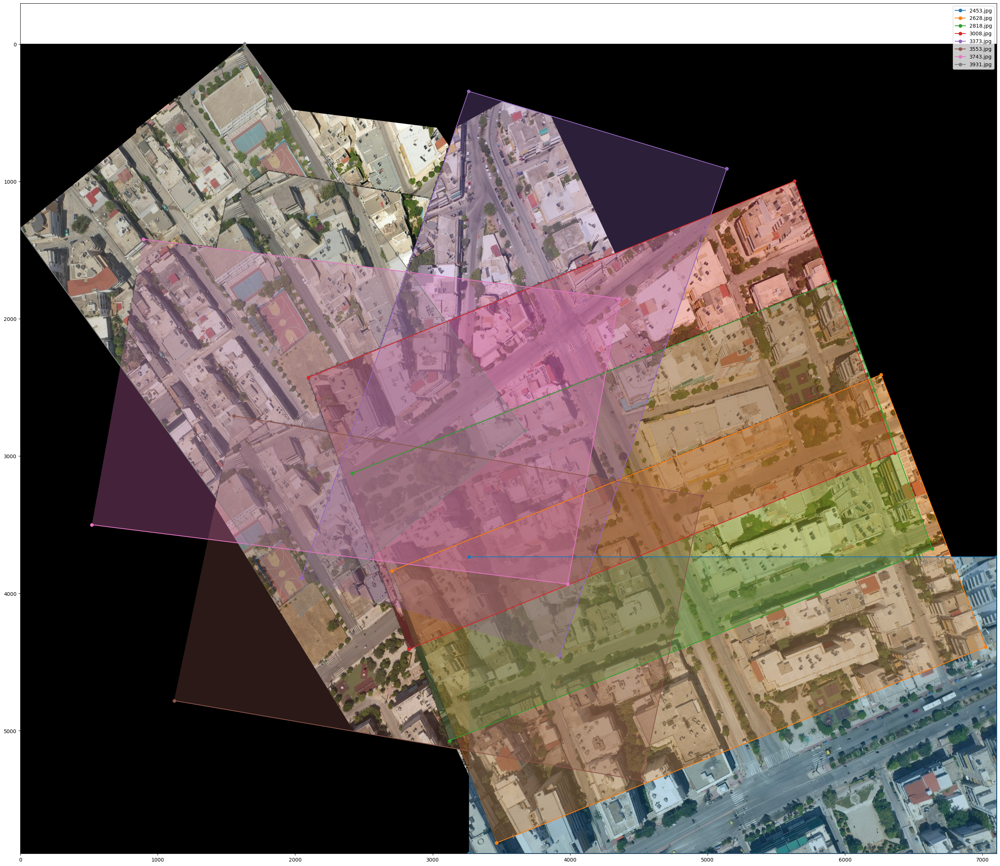

In [4]:
#######################################
# Display & Save Results
#######################################
plt.figure(figsize=(40, 30))
plt.imshow(cv2.cvtColor(combined_image, cv2.COLOR_BGR2RGB))
for _, row in image_corners_df.iterrows():
    corners = row['corners']
    x_coords, y_coords = corners[:, 0], corners[:, 1]
    plt.plot(x_coords, y_coords, 'o-', label=os.path.basename(row['image_path']))
    plt.fill(x_coords, y_coords, alpha=0.3)
plt.axis('on')
plt.legend()  # Uncomment if you want a legend
plt.show()

# Sort the DataFrame by 'frame_number'
image_corners_df = image_corners_df.sort_values(by='frame_number', ascending=True)

# Reset the index after sorting (optional)
image_corners_df = image_corners_df.reset_index(drop=True)

image_corners_df.to_csv(os.path.join(general_folder_path, 'results/image_corners.csv'), index=False)
torch.cuda.empty_cache()

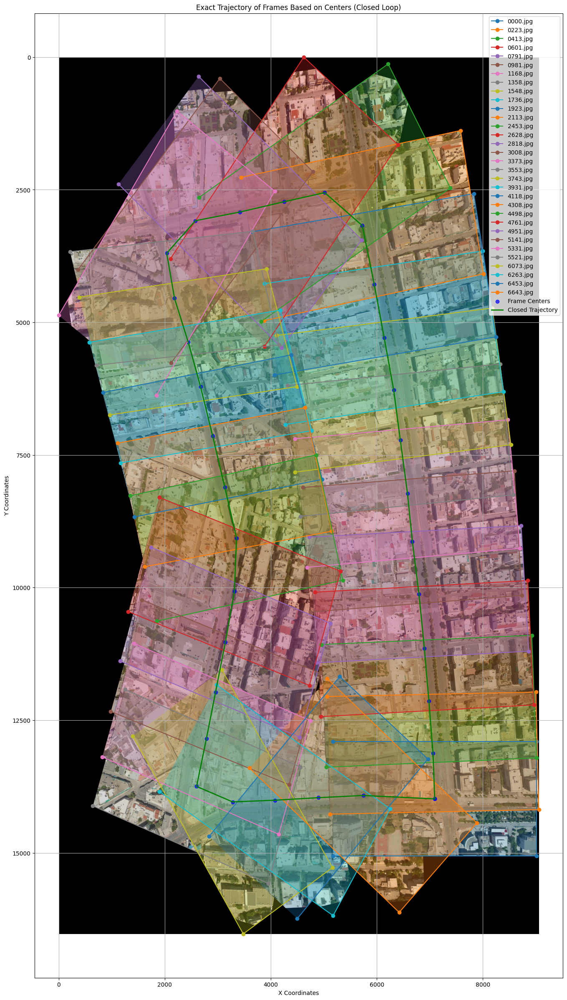

In [1]:
import os
import ast
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
from shapely.geometry import Polygon, LineString

# File paths
general_folder_path = '/home/oussama/Documents/EPFL/PDS_LUTS/'
corners_csv_path = os.path.join(general_folder_path, 'results/image_corners.csv')
frames_csv_path = os.path.join(general_folder_path, 'Dataset/DJI_0763_data.csv')
combined_image_path = os.path.join(general_folder_path, 'final_panorama.jpg')

# Load data
image_corners_df = pd.read_csv(corners_csv_path)

# Function to clean and fix the corners column
def fix_corners_format(corners_str):
    # Remove stray spaces, and ensure brackets are separated by commas
    corners_str = corners_str.replace('\n', '').replace('  ', ' ').replace('[ ', '[').replace(' [', ',[').replace('  ', ',').replace(' ', ',')
    # Convert to a valid Python list
    corners = ast.literal_eval(corners_str)
    return np.array(corners)

# Apply the fix to the corners column
image_corners_df['corners'] = image_corners_df['corners'].apply(fix_corners_format)

#######################################
# Compute Frame Centers from image_corners_df
#######################################
# Calculate the center of each frame
image_corners_df['center'] = image_corners_df['corners'].apply(lambda c: c.mean(axis=0) if c.size else np.array([0, 0]))
image_corners_df['center_x'] = image_corners_df['center'].apply(lambda pt: pt[0])
image_corners_df['center_y'] = image_corners_df['center'].apply(lambda pt: pt[1])

#######################################
# Extract Trajectory from Frame Centers
#######################################
# Sort DataFrame by frame number to ensure correct trajectory order
image_corners_df = image_corners_df.sort_values(by='frame_number', ascending=True).reset_index(drop=True)

# Extract the trajectory as a sequence of frame centers
trajectory = image_corners_df[['center_x', 'center_y']].values

#######################################
# Plot Frame Centers and Trajectory
#######################################

# Load the final panorama image
combined_image = cv2.imread(combined_image_path)

plt.figure(figsize=(40, 30))
plt.imshow(cv2.cvtColor(combined_image, cv2.COLOR_BGR2RGB))

# Plot corners of each frame
for _, row in image_corners_df.iterrows():
    corners = row['corners']
    if corners.size:  # Skip if corners are empty
        x_coords, y_coords = corners[:, 0], corners[:, 1]
        plt.plot(x_coords, y_coords, 'o-', label=os.path.basename(row['image_path']))
        plt.fill(x_coords, y_coords, alpha=0.3)
        
# Close the loop by appending the first center to the end of the trajectory
trajectory = np.vstack([trajectory, trajectory[0]])

# Plot frame centers
plt.scatter(trajectory[:, 0], trajectory[:, 1], color='blue', label='Frame Centers', alpha=0.7)

# Plot the closed trajectory as a line connecting the centers
plt.plot(trajectory[:, 0], trajectory[:, 1], color='green', linewidth=2, label='Closed Trajectory')

# Add labels, legend, and grid
plt.title('Exact Trajectory of Frames Based on Centers (Closed Loop)')
plt.xlabel('X Coordinates')
plt.ylabel('Y Coordinates')
plt.legend()
# plt.axis('equal')  # Ensure equal scaling on both axes for proper visualization
plt.grid(True)

# Show the plot
plt.show()

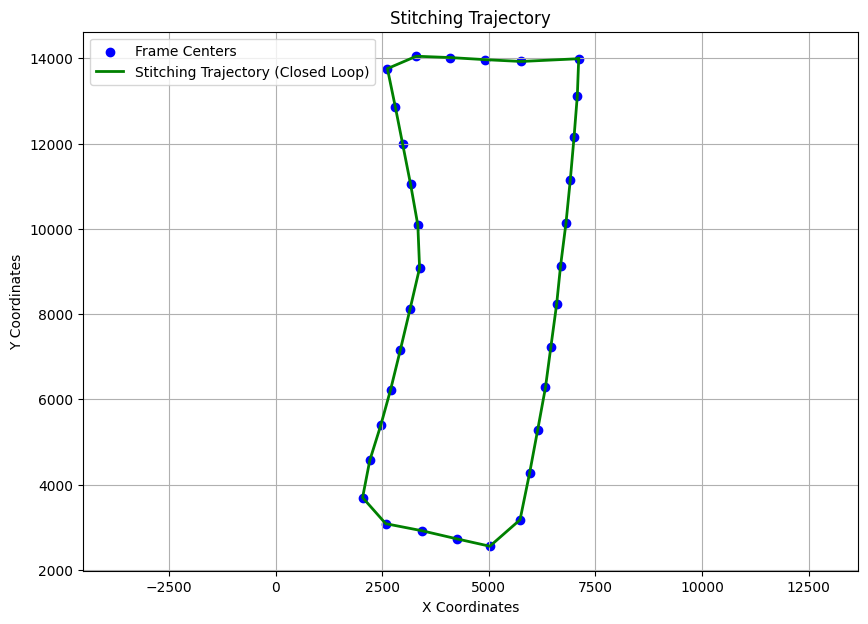

In [2]:
import os
import ast
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2

# File paths
general_folder_path = '/home/oussama/Documents/EPFL/PDS_LUTS/'
corners_csv_path = os.path.join(general_folder_path, 'results/image_corners_2_0_60.csv')
frames_csv_path = os.path.join(general_folder_path, 'Dataset/DJI_0763_data.csv')
combined_image_path = os.path.join(general_folder_path, 'results/map_2_0_60.jpg')

# Load data
image_corners_df = pd.read_csv(corners_csv_path)
frames_df = pd.read_csv(frames_csv_path)

# Fix the corners column in image_corners_df
def fix_corners_format(corners_str):
    corners_str = corners_str.replace('\n', '').replace('  ', ' ').replace('[ ', '[').replace(' [', ',[').replace('  ', ',').replace(' ', ',')
    try:
        corners = ast.literal_eval(corners_str)
        return np.array(corners)
    except Exception as e:
        print(f"Error parsing corners: {corners_str}\n{e}")
        return np.array([])

image_corners_df['corners'] = image_corners_df['corners'].apply(fix_corners_format)

#######################################
# Stitching Trajectory (From Centers)
#######################################
# Compute centers
image_corners_df['center'] = image_corners_df['corners'].apply(lambda c: c.mean(axis=0) if c.size else np.array([0, 0]))
image_corners_df['center_x'] = image_corners_df['center'].apply(lambda pt: pt[0])
image_corners_df['center_y'] = image_corners_df['center'].apply(lambda pt: pt[1])

# Sort by frame number
image_corners_df = image_corners_df.sort_values(by='frame_number', ascending=True).reset_index(drop=True)

# Extract stitching trajectory
trajectory_stitching = image_corners_df[['center_x', 'center_y']].values

#######################################
# Visualization
#######################################
# Plot stitching trajectory
plt.figure(figsize=(10, 7))
plt.scatter(trajectory_stitching[:, 0], trajectory_stitching[:, 1], color='blue', label='Frame Centers')
plt.plot(np.append(trajectory_stitching[:, 0], trajectory_stitching[0, 0]),
         np.append(trajectory_stitching[:, 1], trajectory_stitching[0, 1]),
         color='green', linewidth=2, label='Stitching Trajectory (Closed Loop)')
plt.title('Stitching Trajectory')
plt.xlabel('X Coordinates')
plt.ylabel('Y Coordinates')
plt.axis('equal')
plt.legend()
plt.grid(True)
plt.show()


Pairwise 3D Distances Between Frames: [ 76.29667033  77.11515941  76.46934149  76.8124634   77.20839771
  76.41802643  76.85437265  76.90620434  76.24991673  76.47559297
  77.02957142  80.51174847  70.95826883  77.05344912  77.23791129
  78.7166213   73.06127307  77.00439844  76.29438896  76.26523809
  77.03351302  77.16899361  76.88929751  77.10679677  77.208438
  77.10361609  77.20784093  76.3831972   77.07533546  77.22856486
  77.1770733  126.0651503 ]
Total 3D Distance Covered: 2504.586831509523


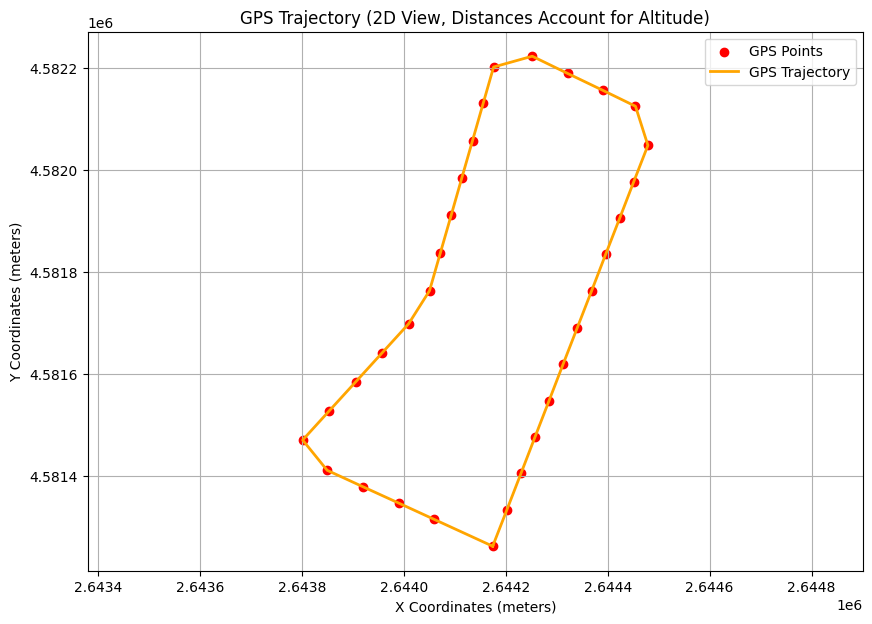

In [3]:
import os
import ast
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pyproj import Transformer

# File paths
general_folder_path = '/home/oussama/Documents/EPFL/PDS_LUTS/'
corners_csv_path = os.path.join(general_folder_path, 'results/image_corners.csv')
frames_csv_path = os.path.join(general_folder_path, 'Dataset/DJI_0763_data.csv')

# Load data
image_corners_df = pd.read_csv(corners_csv_path)
frames_df = pd.read_csv(frames_csv_path)

# Fix the corners column in image_corners_df
def fix_corners_format(corners_str):
    corners_str = corners_str.replace('\n', '').replace('  ', ' ').replace('[ ', '[').replace(' [', ',[').replace('  ', ',').replace(' ', ',')
    try:
        corners = ast.literal_eval(corners_str)
        return np.array(corners)
    except Exception as e:
        print(f"Error parsing corners: {corners_str}\n{e}")
        return np.array([])

image_corners_df['corners'] = image_corners_df['corners'].apply(fix_corners_format)

#######################################
# Stitching Trajectory (From Centers)
#######################################
# Compute centers
image_corners_df['center'] = image_corners_df['corners'].apply(lambda c: c.mean(axis=0) if c.size else np.array([0, 0]))
image_corners_df['center_x'] = image_corners_df['center'].apply(lambda pt: pt[0])
image_corners_df['center_y'] = image_corners_df['center'].apply(lambda pt: pt[1])

# Sort by frame number
image_corners_df = image_corners_df.sort_values(by='frame_number', ascending=True).reset_index(drop=True)

# Extract stitching trajectory
trajectory_stitching = image_corners_df[['center_x', 'center_y']].values

#######################################
# GPS Trajectory with Altitude
#######################################
# Filter frames_df to include only frames used in stitching
image_corners_df['frame_number'] = image_corners_df['frame_number'].astype(int)
filtered_frames_df = frames_df[frames_df['FrameCnt'].isin(image_corners_df['frame_number'])].copy()

# Convert Latitude/Longitude to planar coordinates (e.g., EPSG:3857)
transformer = Transformer.from_crs("EPSG:4326", "EPSG:3857", always_xy=True)
filtered_frames_df['X'], filtered_frames_df['Y'] = transformer.transform(
    filtered_frames_df['Longitude'].values, filtered_frames_df['Latitude'].values
)

# Include altitude for 3D trajectory calculations
trajectory_gps_3d = filtered_frames_df[['X', 'Y', 'Altitude']].values
trajectory_gps_3d = np.vstack([trajectory_gps_3d, trajectory_gps_3d[0]])

#######################################
# Calculate 3D Distances
#######################################
# Calculate pairwise 3D distances for GPS trajectory
distances = np.sqrt(np.sum(np.diff(trajectory_gps_3d, axis=0)**2, axis=1))

# Total 3D distance
total_distance = np.sum(distances)

print("Pairwise 3D Distances Between Frames:", distances)
print("Total 3D Distance Covered:", total_distance)

#######################################
# Visualization
#######################################
# Plot GPS trajectory (2D view, with altitude considered in distance)
plt.figure(figsize=(10, 7))
plt.scatter(filtered_frames_df['X'], filtered_frames_df['Y'], color='red', label='GPS Points')
plt.plot(trajectory_gps_3d[:, 0], trajectory_gps_3d[:, 1], color='orange', linewidth=2, label='GPS Trajectory')
plt.title('GPS Trajectory (2D View, Distances Account for Altitude)')
plt.xlabel('X Coordinates (meters)')
plt.ylabel('Y Coordinates (meters)')
plt.axis('equal')
plt.legend()
plt.grid(True)
plt.show()


Angle between first two points (radians): 1.6082
Angle between first two points (degrees): 92.15


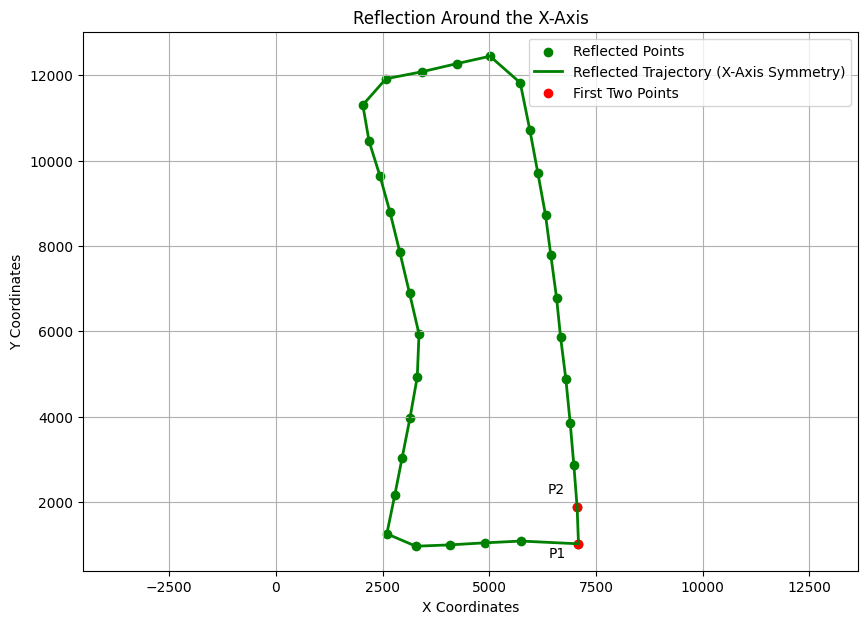

In [4]:
import numpy as np
import matplotlib.pyplot as plt

def reflect_around_x_axis(point):
    """
    Reflect a point around the X-axis.
    """
    reflected_y = -point[1] + 15000  # Invert the y-coordinate + shift to keep positive
    return np.array([point[0], reflected_y])  # Keep the x-coordinate unchanged

def calculate_angle(p1, p2):
    """
    Calculate the angle (in radians) between two points relative to the x-axis.
    """
    vector = p2 - p1
    angle = np.arctan2(vector[1], vector[0])  # Returns angle in radians
    return angle

#######################################
# Apply Reflection Around the X-Axis
#######################################
trajectory_stitching_reflected = trajectory_stitching.copy()

# Reflect all points in the trajectory
for i in range(len(trajectory_stitching)):
    trajectory_stitching_reflected[i] = reflect_around_x_axis(trajectory_stitching[i])

#######################################
# Calculate the Angle
#######################################
# First two points in the reflected trajectory
p1 = trajectory_stitching_reflected[0]
p2 = trajectory_stitching_reflected[1]

# Calculate the angle
angle_radians = calculate_angle(p1, p2)
angle_degrees = np.degrees(angle_radians)  # Convert to degrees for better interpretation

print(f"Angle between first two points (radians): {angle_radians:.4f}")
print(f"Angle between first two points (degrees): {angle_degrees:.2f}")

#######################################
# Visualization
#######################################
plt.figure(figsize=(10, 7))

# Reflected stitching trajectory
plt.scatter(trajectory_stitching_reflected[:, 0], trajectory_stitching_reflected[:, 1], color='green', label='Reflected Points')
plt.plot(np.append(trajectory_stitching_reflected[:, 0], trajectory_stitching_reflected[0, 0]),
         np.append(trajectory_stitching_reflected[:, 1], trajectory_stitching_reflected[0, 1]),
         color='green', linewidth=2, label='Reflected Trajectory (X-Axis Symmetry)')

# Highlight the first two points
plt.scatter([p1[0], p2[0]], [p1[1], p2[1]], color='red', label='First Two Points')
plt.annotate('P1', (p1[0], p1[1]), textcoords="offset points", xytext=(-15, -10), ha='center')
plt.annotate('P2', (p2[0], p2[1]), textcoords="offset points", xytext=(-15, 10), ha='center')

plt.title('Reflection Around the X-Axis')
plt.xlabel('X Coordinates')
plt.ylabel('Y Coordinates')
plt.axis('equal')
plt.legend()
plt.grid(True)
plt.show()


Stitching Trajectory Angle (radians): 1.6082
Stitching Trajectory Angle (degrees): 92.15
GPS Trajectory Angle (radians): 1.1989
GPS Trajectory Angle (degrees): 68.69
Aligned GPS Trajectory Angle (radians): 1.6082
Aligned GPS Trajectory Angle (degrees): 92.15


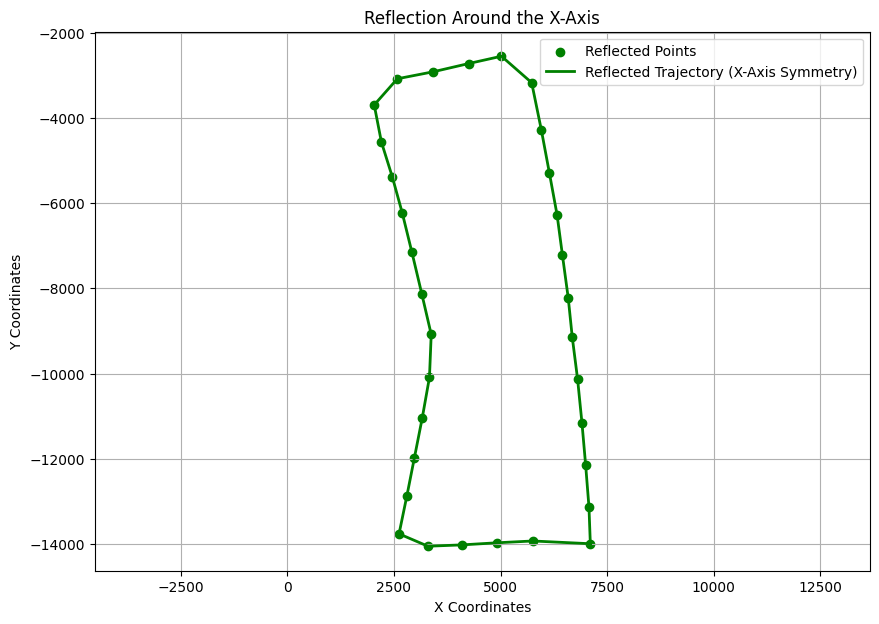

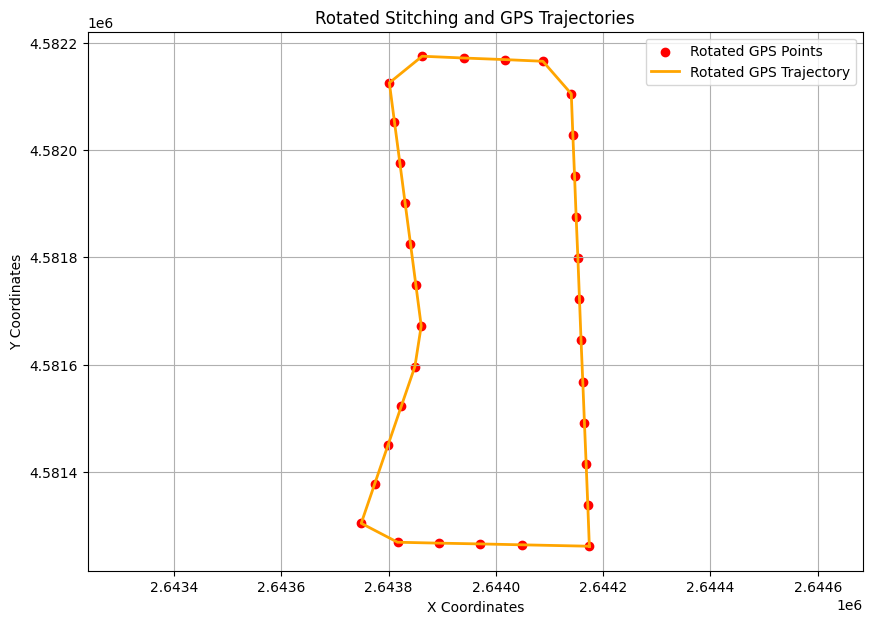

In [5]:
import os
import ast
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pyproj import Transformer

# File paths
general_folder_path = '/home/oussama/Documents/EPFL/PDS_LUTS/'
corners_csv_path = os.path.join(general_folder_path, 'results/image_corners_2_0_60.csv')
frames_csv_path = os.path.join(general_folder_path, 'Dataset/DJI_0763_data.csv')

# Helper Functions
def calculate_angle(p1, p2):
    """Calculate the angle (in radians) between two points relative to the x-axis."""
    vector = p2 - p1
    return np.arctan2(vector[1], vector[0])

def fix_corners_format(corners_str):
    """Fix corners format to convert from string to numpy array."""
    corners_str = corners_str.replace('\n', '').replace('  ', ' ').replace('[ ', '[').replace(' [', ',[').replace('  ', ',').replace(' ', ',')
    try:
        corners = ast.literal_eval(corners_str)
        return np.array(corners)
    except Exception as e:
        print(f"Error parsing corners: {corners_str}\n{e}")
        return np.array([])

def reflect_around_x_axis(point):
    """Reflect a point around the X-axis."""
    reflected_y = -point[1]  # Invert the y-coordinate
    return np.array([point[0], reflected_y])  # Keep the x-coordinate unchanged

def rotate_trajectory(trajectory, center, angle):
    """Rotate an entire trajectory around a given center by a specific angle (in radians)."""
    rotation_matrix = np.array([
        [np.cos(angle), -np.sin(angle)],
        [np.sin(angle),  np.cos(angle)]
    ])
    return (trajectory - center) @ rotation_matrix.T + center

# Load data
image_corners_df = pd.read_csv(corners_csv_path)
image_corners_df = image_corners_df.sort_values(by='frame_number', ascending=True)
frames_df = pd.read_csv(frames_csv_path)

#######################################
# Stitching Trajectory (From Centers)
#######################################
# Compute centers
image_corners_df['corners'] = image_corners_df['corners'].apply(fix_corners_format)
image_corners_df['center'] = image_corners_df['corners'].apply(lambda c: c.mean(axis=0) if c.size else np.array([0, 0]))
image_corners_df['center_x'] = image_corners_df['center'].apply(lambda pt: pt[0])
image_corners_df['center_y'] = image_corners_df['center'].apply(lambda pt: pt[1])

# Sort by frame number
image_corners_df = image_corners_df.sort_values(by='frame_number', ascending=True).reset_index(drop=True)

# Extract stitching trajectory
trajectory_stitching = image_corners_df[['center_x', 'center_y']].values

# Reflect all points in the trajectory
trajectory_stitching_reflected = trajectory_stitching.copy()
trajectory_stitching_reflected[:, 1] = -trajectory_stitching[:, 1]

# Calculate stitching trajectory angle
p1 = trajectory_stitching_reflected[0]
p2 = trajectory_stitching_reflected[1]
angle_stitching = calculate_angle(p1, p2)

print(f"Stitching Trajectory Angle (radians): {angle_stitching:.4f}")
print(f"Stitching Trajectory Angle (degrees): {np.degrees(angle_stitching):.2f}")

#######################################
# GPS Trajectory (Planar Projection)
#######################################
image_corners_df['frame_number'] = image_corners_df['frame_number'].astype(int)
filtered_frames_df = frames_df[frames_df['FrameCnt'].isin(image_corners_df['frame_number'])].copy()

# Convert Latitude/Longitude to planar coordinates (EPSG:3857)
transformer = Transformer.from_crs("EPSG:4326", "EPSG:3857", always_xy=True)
filtered_frames_df['X'], filtered_frames_df['Y'] = transformer.transform(
    filtered_frames_df['Longitude'].values, filtered_frames_df['Latitude'].values
)

# Extract GPS trajectory
trajectory_gps_3d = filtered_frames_df[['X', 'Y', 'Altitude']].values
# trajectory_gps_3d = np.vstack([trajectory_gps_3d, trajectory_gps_3d[0]])  # Close loop

# Calculate GPS trajectory angle
p1_gps = trajectory_gps_3d[0, :2]
p2_gps = trajectory_gps_3d[1, :2]
angle_gps = calculate_angle(p1_gps, p2_gps)

print(f"GPS Trajectory Angle (radians): {angle_gps:.4f}")
print(f"GPS Trajectory Angle (degrees): {np.degrees(angle_gps):.2f}")

#######################################
# Align GPS Trajectory to Stitching Trajectory
#######################################
# Calculate rotation needed
rotation_needed = angle_stitching - angle_gps
if np.cross(p2 - p1, p2_gps - p1_gps) < 0:  # Ensure counterclockwise
    rotation_needed += 2 * np.pi

# Rotate GPS trajectory
trajectory_gps_aligned = rotate_trajectory(trajectory_gps_3d[:, :2], p1_gps, rotation_needed)

# Verify new GPS trajectory angle
p1_gps_aligned = trajectory_gps_aligned[0]
p2_gps_aligned = trajectory_gps_aligned[1]
new_angle_gps = calculate_angle(p1_gps_aligned, p2_gps_aligned)

print(f"Aligned GPS Trajectory Angle (radians): {new_angle_gps:.4f}")
print(f"Aligned GPS Trajectory Angle (degrees): {np.degrees(new_angle_gps):.2f}")

#######################################
# Visualization
#######################################
plt.figure(figsize=(10, 7))

# Reflected stitching trajectory
plt.scatter(trajectory_stitching_reflected[:, 0], trajectory_stitching_reflected[:, 1], color='green', label='Reflected Points')
plt.plot(np.append(trajectory_stitching_reflected[:, 0], trajectory_stitching_reflected[0, 0]),
         np.append(trajectory_stitching_reflected[:, 1], trajectory_stitching_reflected[0, 1]),
         color='green', linewidth=2, label='Reflected Trajectory (X-Axis Symmetry)')

plt.title('Reflection Around the X-Axis')
plt.xlabel('X Coordinates')
plt.ylabel('Y Coordinates')
plt.axis('equal')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 7))
# Rotated GPS trajectory
plt.scatter(trajectory_gps_aligned[:, 0], trajectory_gps_aligned[:, 1], color='red', label='Rotated GPS Points')
plt.plot(np.append(trajectory_gps_aligned[:, 0], trajectory_gps_aligned[0, 0]),
         np.append(trajectory_gps_aligned[:, 1], trajectory_gps_aligned[0, 1]),
         color='orange', linewidth=2, label='Rotated GPS Trajectory')

plt.title('Rotated Stitching and GPS Trajectories')
plt.xlabel('X Coordinates')
plt.ylabel('Y Coordinates')
plt.axis('equal')
plt.legend()
plt.grid(True)
plt.show()


Stitching Trajectory Center: [ 4558.99641586 -8606.22560317]
GPS Trajectory Center: [2643979.29639501 4581702.90564894]
Stitching Scale Factor: 863.6750757269446
GPS Scale Factor: 76.28397108719815


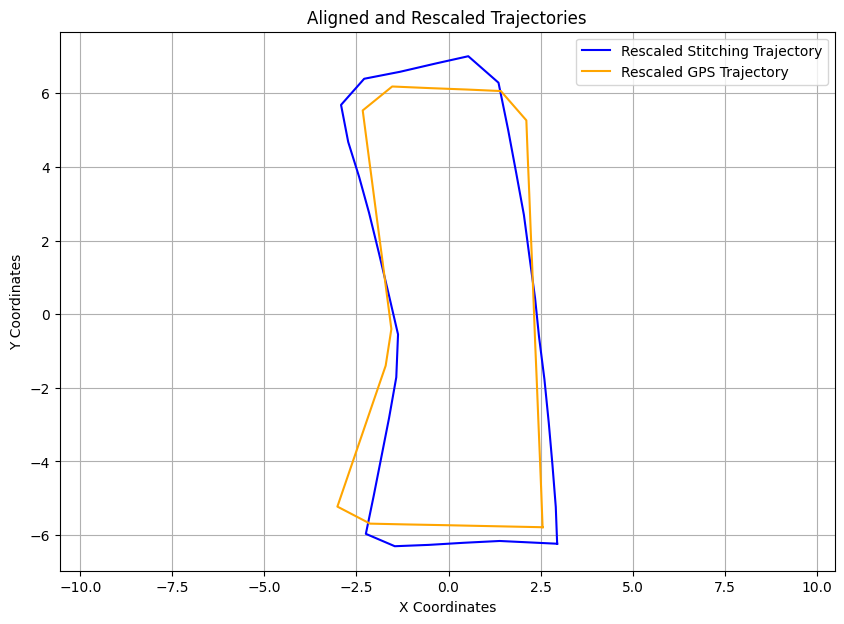

In [6]:
#######################################
# Align Trajectories to Relative Reference Frame
#######################################

def align_to_center(trajectory):
    """Center a trajectory around (0, 0)."""
    center = trajectory.mean(axis=0)
    return trajectory - center, center

# Center both trajectories at (0, 0)
trajectory_stitching_aligned, stitching_center = align_to_center(trajectory_stitching_reflected)
trajectory_gps_aligned_centered, gps_center = align_to_center(trajectory_gps_aligned)

print(f"Stitching Trajectory Center: {stitching_center}")
print(f"GPS Trajectory Center: {gps_center}")

#######################################
# Rescale Trajectories
#######################################

def calculate_scale_factor(trajectory):
    """Calculate scale factor based on the distance between the first two points."""
    p1, p2 = trajectory[0], trajectory[1]
    return np.linalg.norm(p2 - p1)

# Calculate scaling factors for both trajectories
scale_stitching = calculate_scale_factor(trajectory_stitching_aligned)
scale_gps = calculate_scale_factor(trajectory_gps_aligned_centered)

# Rescale trajectories
trajectory_stitching_rescaled = trajectory_stitching_aligned / scale_stitching
trajectory_gps_rescaled = trajectory_gps_aligned_centered / scale_gps

print(f"Stitching Scale Factor: {scale_stitching}")
print(f"GPS Scale Factor: {scale_gps}")

#######################################
# Visualization
#######################################

plt.figure(figsize=(10, 7))

# Plot rescaled stitching trajectory
plt.plot(np.append(trajectory_stitching_rescaled[:, 0], trajectory_stitching_rescaled[0, 0]),
         np.append(trajectory_stitching_rescaled[:, 1], trajectory_stitching_rescaled[0, 1]),
         color='blue', label='Rescaled Stitching Trajectory')

# Plot rescaled GPS trajectory
plt.plot(np.append(trajectory_gps_rescaled[:, 0], trajectory_gps_rescaled[0, 0]),
         np.append(trajectory_gps_rescaled[:, 1], trajectory_gps_rescaled[0, 1]),
         color='orange', label='Rescaled GPS Trajectory')

plt.title('Aligned and Rescaled Trajectories')
plt.xlabel('X Coordinates')
plt.ylabel('Y Coordinates')
plt.axis('equal')
plt.legend()
plt.grid(True)
plt.show()


In [7]:
import numpy as np

def mean_euclidean_distance(T1, T2):
    """
    Compute the Mean Euclidean Distance between two trajectories.
    
    Parameters:
        T1 (numpy.ndarray): Trajectory 1, shape (n, 2) where n is the number of points.
        T2 (numpy.ndarray): Trajectory 2, shape (n, 2).
        
    Returns:
        float: Mean Euclidean Distance.
    """
    distances = np.sqrt(np.sum((T1 - T2)**2, axis=1))
    mean_distance = np.mean(distances)
    return mean_distance

def root_mean_square_error(T1, T2):
    """
    Compute the Root Mean Square Error (RMSE) between two trajectories.
    
    Parameters:
        T1 (numpy.ndarray): Trajectory 1, shape (n, 2) where n is the number of points.
        T2 (numpy.ndarray): Trajectory 2, shape (n, 2).
        
    Returns:
        float: RMSE value.
    """
    squared_errors = np.sum((T1 - T2)**2, axis=1)
    rmse = np.sqrt(np.mean(squared_errors))
    return rmse

# Example Usage
# Assuming `trajectory_stitching_rescaled` and `trajectory_gps_rescaled` are your two trajectories
mean_distance = mean_euclidean_distance(trajectory_stitching_rescaled, trajectory_gps_rescaled)
rmse_value = root_mean_square_error(trajectory_stitching_rescaled, trajectory_gps_rescaled)

print(f"Mean Euclidean Distance: {mean_distance:.4f}")
print(f"Root Mean Square Error (RMSE): {rmse_value:.4f}")


Mean Euclidean Distance: 0.6097
Root Mean Square Error (RMSE): 0.6923


In [8]:
def trajectory_length(trajectory):
    """
    Calculate the total length of a trajectory.
    Parameters:
        trajectory (numpy.ndarray): Trajectory points, shape (n, 2).
    Returns:
        float: Total length of the trajectory.
    """
    segment_distances = np.sqrt(np.sum(np.diff(trajectory, axis=0)**2, axis=1))
    return np.sum(segment_distances)

# Calculate GPS trajectory length as the reference
length_gps = trajectory_length(trajectory_gps_rescaled)

# Calculate percentage similarity for MED
percentage_similarity_med = 100 - (mean_distance / length_gps * 100)

# Calculate percentage similarity for RMSE
percentage_similarity_rmse = 100 - (rmse_value / length_gps * 100)

print(f"Mean Euclidean Distance Percentage Similarity: {percentage_similarity_med:.2f}%")
print(f"RMSE Percentage Similarity: {percentage_similarity_rmse:.2f}%")


Mean Euclidean Distance Percentage Similarity: 98.04%
RMSE Percentage Similarity: 97.78%


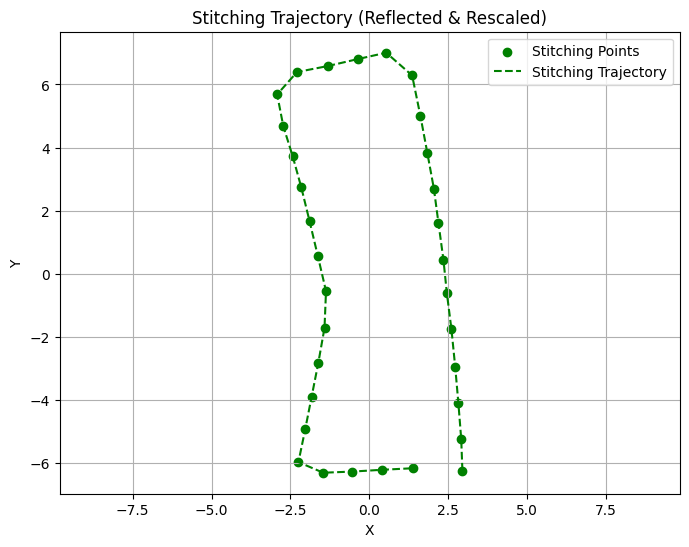

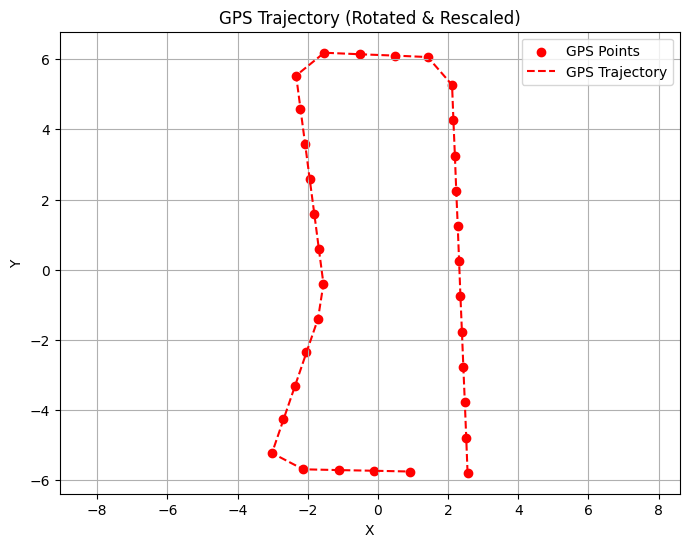

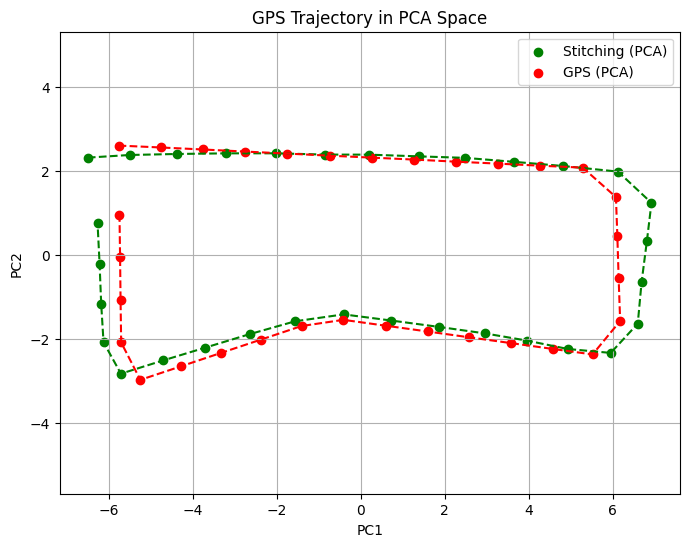


--- Metrics in PCA Space (Truncated to Same Length) ---
Mean Euclidean Distance (MED): 0.4275
Root Mean Square Error (RMSE): 0.4754
Total Length of GPS Trajectory in PCA Space: 31.1792
Similarity (MED-based): 98.63%
Similarity (RMSE-based): 98.48%


In [9]:
import os
import ast
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pyproj import Transformer
from sklearn.decomposition import PCA

###############################################################################
# File Paths
###############################################################################
general_folder_path = '/home/oussama/Documents/EPFL/PDS_LUTS/'
corners_csv_path = os.path.join(general_folder_path, 'results/image_corners_2_0_60.csv')
frames_csv_path = os.path.join(general_folder_path, 'Dataset/DJI_0763_data.csv')

###############################################################################
# Helper Functions
###############################################################################
def fix_corners_format(corners_str):
    """Fix corners format to convert from string to a NumPy array."""
    corners_str = corners_str.replace('\n', '').replace('  ', ' ').replace('[ ', '[')
    corners_str = corners_str.replace(' [', ',[').replace('  ', ',').replace(' ', ',')
    try:
        corners = ast.literal_eval(corners_str)
        return np.array(corners)
    except Exception as e:
        print(f"Error parsing corners: {corners_str}\n{e}")
        return np.array([])

def calculate_angle(p1, p2):
    """Calculate the angle (in radians) between two points relative to the x-axis."""
    vector = p2 - p1
    return np.arctan2(vector[1], vector[0])

def reflect_around_x_axis(trajectory):
    """Reflect a 2D trajectory around the X-axis."""
    reflected = trajectory.copy()
    reflected[:, 1] = -reflected[:, 1]
    return reflected

def align_to_center(trajectory):
    """Center a trajectory around (0, 0)."""
    center = trajectory.mean(axis=0)
    return trajectory - center

def rotate_trajectory(trajectory, center, angle):
    """
    Rotate an entire 2D trajectory around a given center by a specific angle (radians).
    trajectory: Nx2 array of points
    center: point around which rotation is done
    angle: angle in radians
    """
    rotation_matrix = np.array([
        [np.cos(angle), -np.sin(angle)],
        [np.sin(angle),  np.cos(angle)]
    ])
    return (trajectory - center) @ rotation_matrix.T + center

def calculate_scale_factor(trajectory):
    """
    Calculate the scale factor based on the distance between the first two points
    of a 2D trajectory.
    """
    p1, p2 = trajectory[0], trajectory[1]
    return np.linalg.norm(p2 - p1)

def mean_euclidean_distance(T1, T2):
    """Compute the Mean Euclidean Distance (MED) between two trajectories."""
    distances = np.sqrt(np.sum((T1 - T2)**2, axis=1))
    return np.mean(distances)

def root_mean_square_error(T1, T2):
    """Compute the Root Mean Square Error (RMSE) between two trajectories."""
    squared_diffs = np.sum((T1 - T2)**2, axis=1)
    return np.sqrt(np.mean(squared_diffs))

def calculate_similarity_percentage(metric, total_length):
    """
    Calculate a percentage similarity measure from a given metric.
    Similarity = max(0, 100 - (metric / total_length * 100)).
    """
    return max(0, 100 - (metric / total_length * 100))

def calculate_trajectory_length(trajectory):
    """Calculate the total length of a 2D trajectory."""
    segment_lengths = np.sqrt(np.sum(np.diff(trajectory, axis=0)**2, axis=1))
    return np.sum(segment_lengths)

###############################################################################
# 1) Load the Stitching Trajectory
###############################################################################
image_corners_df = pd.read_csv(corners_csv_path).sort_values(by='frame_number', ascending=True)
image_corners_df['corners'] = image_corners_df['corners'].apply(fix_corners_format)

# Compute the center of each image (the stitching "trajectory")
image_corners_df['center'] = image_corners_df['corners'].apply(
    lambda c: c.mean(axis=0) if c.size else np.array([0, 0])
)
image_corners_df['center_x'] = image_corners_df['center'].apply(lambda pt: pt[0])
image_corners_df['center_y'] = image_corners_df['center'].apply(lambda pt: pt[1])
image_corners_df = image_corners_df.sort_values(by='frame_number').reset_index(drop=True)

# Extract the 2D stitching trajectory
trajectory_stitching = image_corners_df[['center_x', 'center_y']].values

###############################################################################
# 2) Reflect (Optional) and Calculate Angle
###############################################################################
trajectory_stitching_reflected = reflect_around_x_axis(trajectory_stitching)

p1_stitch = trajectory_stitching_reflected[0]
p2_stitch = trajectory_stitching_reflected[1]
angle_stitching = calculate_angle(p1_stitch, p2_stitch)

###############################################################################
# 3) Load the GPS Trajectory and Transform to 2D
###############################################################################
frames_df = pd.read_csv(frames_csv_path)
frames_df = frames_df[frames_df['FrameCnt'].isin(image_corners_df['frame_number'])].copy()

transformer = Transformer.from_crs("EPSG:4326", "EPSG:3857", always_xy=True)
frames_df['X'], frames_df['Y'] = transformer.transform(
    frames_df['Longitude'].values, frames_df['Latitude'].values
)
trajectory_gps_3d = frames_df[['X', 'Y', 'Altitude']].values

###############################################################################
# 4) Rotate the GPS Trajectory to Match Stitching's Initial Direction
###############################################################################
p1_gps_2d = trajectory_gps_3d[0, :2]
p2_gps_2d = trajectory_gps_3d[1, :2]
angle_gps = calculate_angle(p1_gps_2d, p2_gps_2d)

rotation_needed = angle_stitching - angle_gps
if np.cross(p2_stitch - p1_stitch, p2_gps_2d - p1_gps_2d) < 0:
    rotation_needed += 2 * np.pi

trajectory_gps_aligned = rotate_trajectory(trajectory_gps_3d[:, :2], p1_gps_2d, rotation_needed)

# Verify the new GPS angle
p1_gps_aligned = trajectory_gps_aligned[0]
p2_gps_aligned = trajectory_gps_aligned[1]
new_angle_gps = calculate_angle(p1_gps_aligned, p2_gps_aligned)

###############################################################################
# 5) Rescale Each Trajectory to Make the First Segment = 1
###############################################################################
scale_stitching = calculate_scale_factor(trajectory_stitching_reflected)
trajectory_stitching_reflected /= scale_stitching  # Now the 1st segment is length 1

scale_gps = calculate_scale_factor(trajectory_gps_aligned)
trajectory_gps_aligned /= scale_gps  # Now the 1st segment is length 1

# Center both trajectories at (0, 0)
trajectory_stitching_reflected = align_to_center(trajectory_stitching_reflected)
trajectory_gps_aligned = align_to_center(trajectory_gps_aligned)

###############################################################################
# 6) Visualization of the "Rescaled" Trajectories (Separate Figures)
###############################################################################
# (a) Stitching Trajectory (Rescaled)
plt.figure(figsize=(8, 6))
plt.scatter(trajectory_stitching_reflected[:, 0], trajectory_stitching_reflected[:, 1], 
            color='green', label='Stitching Points')
plt.plot(
    trajectory_stitching_reflected[:, 0], 
    trajectory_stitching_reflected[:, 1],
    color='green', linestyle='--', label='Stitching Trajectory'
)
plt.title('Stitching Trajectory (Reflected & Rescaled)')
plt.xlabel('X')
plt.ylabel('Y')
plt.axis('equal')
plt.legend()
plt.grid(True)
plt.show()

# (b) GPS Trajectory (Rescaled)
plt.figure(figsize=(8, 6))
plt.scatter(trajectory_gps_aligned[:, 0], trajectory_gps_aligned[:, 1], 
            color='red', label='GPS Points')
plt.plot(
    trajectory_gps_aligned[:, 0], 
    trajectory_gps_aligned[:, 1],
    color='red', linestyle='--', label='GPS Trajectory'
)
plt.title('GPS Trajectory (Rotated & Rescaled)')
plt.xlabel('X')
plt.ylabel('Y')
plt.axis('equal')
plt.legend()
plt.grid(True)
plt.show()

###############################################################################
# 7) PCA on Each Rescaled Trajectory (Optional)
###############################################################################
pca_stitch = PCA(n_components=2)
traj_stitch_pca = pca_stitch.fit_transform(trajectory_stitching_reflected)

pca_gps = PCA(n_components=2)
traj_gps_pca = pca_gps.fit_transform(trajectory_gps_aligned)

# Truncate if they have different lengths
min_length = min(len(traj_stitch_pca), len(traj_gps_pca))
traj_stitch_pca = traj_stitch_pca[:min_length]
traj_gps_pca = traj_gps_pca[:min_length]

###############################################################################
# 8) Visualization: Each PCA Trajectory in its own figure
###############################################################################
# (a) PCA of Stitching and GPS Trajectories
plt.figure(figsize=(8, 6))
plt.scatter(traj_stitch_pca[:, 0], traj_stitch_pca[:, 1], color='green', label='Stitching (PCA)')
plt.plot(
    traj_stitch_pca[:, 0], 
    traj_stitch_pca[:, 1],
    color='green', linestyle='--'
)

plt.scatter(traj_gps_pca[:, 0], traj_gps_pca[:, 1], color='red', label='GPS (PCA)')
plt.plot(
    traj_gps_pca[:, 0], 
    traj_gps_pca[:, 1],
    color='red', linestyle='--'
)
plt.title('GPS Trajectory in PCA Space')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.axis('equal')
plt.legend()
plt.grid(True)
plt.show()

###############################################################################
# 9) Metrics (Optional)
###############################################################################
mean_distance = mean_euclidean_distance(traj_stitch_pca, traj_gps_pca)
rmse_value = root_mean_square_error(traj_stitch_pca, traj_gps_pca)
length_gps_pca = calculate_trajectory_length(traj_gps_pca)

similarity_med = calculate_similarity_percentage(mean_distance, length_gps_pca)
similarity_rmse = calculate_similarity_percentage(rmse_value, length_gps_pca)

print("\n--- Metrics in PCA Space (Truncated to Same Length) ---")
print(f"Mean Euclidean Distance (MED): {mean_distance:.4f}")
print(f"Root Mean Square Error (RMSE): {rmse_value:.4f}")
print(f"Total Length of GPS Trajectory in PCA Space: {length_gps_pca:.4f}")
print(f"Similarity (MED-based): {similarity_med:.2f}%")
print(f"Similarity (RMSE-based): {similarity_rmse:.2f}%")


In [10]:
from scipy.spatial.distance import cdist

def hausdorff_distance(A, B):
    """
    Compute the Hausdorff distance between two sets of points A and B.
    A and B are arrays of shape (N, 2) or (M, 2).
    """
    # Pairwise distances between every point in A and every point in B
    dist_mat = cdist(A, B, metric='euclidean')
    
    # For each point in A, find the closest point in B, and take the maximum
    max_dist_AtoB = np.max(np.min(dist_mat, axis=1))
    
    # For each point in B, find the closest point in A, and take the maximum
    max_dist_BtoA = np.max(np.min(dist_mat, axis=0))
    
    # Hausdorff distance is the maximum of these two values
    return max_dist_AtoB, max_dist_BtoA, max(max_dist_AtoB, max_dist_BtoA)

def frechet_distance(P, Q):
    """
    Compute the Fréchet distance between two curves P and Q, 
    each given as an array of shape (N, 2) or (M, 2).
    
    Returns the Fréchet distance (a single float).
    """
    # We'll implement a classic dynamic programming solution.
    # Reference:
    #   https://stackoverflow.com/questions/24304141/efficient-algorithm-to-calculate-the-discrete-frechet-distance
    # or many similar DP solutions for discrete Fréchet distance.
    
    n, m = len(P), len(Q)
    # Distance cache, initialized to -1
    ca = np.full((n, m), -1.0)

    def euclidean(a, b):
        return np.linalg.norm(a - b)
    
    def _compute(i, j):
        """Compute Frechet distance for P[:i+1], Q[:j+1]."""
        if ca[i, j] > -1:
            return ca[i, j]
        elif i == 0 and j == 0:
            ca[i, j] = euclidean(P[0], Q[0])
        elif i > 0 and j == 0:
            ca[i, j] = max(_compute(i-1, 0), euclidean(P[i], Q[0]))
        elif i == 0 and j > 0:
            ca[i, j] = max(_compute(0, j-1), euclidean(P[0], Q[j]))
        else:
            ca[i, j] = max(
                min(_compute(i-1, j), _compute(i-1, j-1), _compute(i, j-1)),
                euclidean(P[i], Q[j])
            )
        return ca[i, j]

    return _compute(n-1, m-1)

In [11]:
# 1) Hausdorff
hdAtoB, hdBtoA, hd = hausdorff_distance(traj_stitch_pca, traj_gps_pca)
print(f"Hausdorff (A->B): {hdAtoB:.4f}")
print(f"Hausdorff (B->A): {hdBtoA:.4f}")
print(f"Hausdorff (Overall): {hd:.4f}")

# 2) Fréchet
f_dist = frechet_distance(traj_stitch_pca, traj_gps_pca)
print(f"Fréchet Distance: {f_dist:.4f}")


Hausdorff (A->B): 0.8576
Hausdorff (B->A): 0.7127
Hausdorff (Overall): 0.8576
Fréchet Distance: 0.8576


In [12]:
# Example: Use the total length of the stitching trajectory in PCA space
length_stitch = calculate_trajectory_length(traj_stitch_pca)
length_gps    = calculate_trajectory_length(traj_gps_pca)

# Option A: Use the STITCHING length as reference
ref_length = length_stitch

# Option B: Or, if you want the smaller length (some prefer more strict measure)
# ref_length = min(length_stitch, length_gps)

# Suppose you've computed:
#   hd = Hausdorff distance (Overall)
#   f_dist = Fréchet distance

def similarity_percentage(metric, ref_length):
    """
    Convert a distance metric into a percentage, referencing the ref_length.
    Similar to how you did with MED or RMSE.
    """
    # Avoid division by zero
    if ref_length <= 0:
        return 0.0
    return max(0, 100 - (metric / ref_length * 100))

similarity_hd = similarity_percentage(hd, ref_length)
similarity_fr = similarity_percentage(f_dist, ref_length)

print(f"Hausdorff-based Similarity: {similarity_hd:.2f}%")
print(f"Fréchet-based Similarity:   {similarity_fr:.2f}%")


Hausdorff-based Similarity: 97.42%
Fréchet-based Similarity:   97.42%
